In [1]:
# Imports
# !pip install torchinfo
import torch
import torch.nn as nn
import torch.utils.data as Data
from torchvision import datasets, transforms
from torchinfo import summary
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import time
import TrainerVTS_V07D1 as TP
import DataSetting as DS

### Loader

In [2]:
gpu = 5
date = '240426'
run = '900N'

In [3]:
datadir = '../dataset/0509/make18_900_split/'
print('\n'.join(os.listdir(datadir)))
logger = DS.ExperimentInfo(date, run, gpu, datadir)
logger.log()

make18_900_log.txt
ind_many_train.npy
ind_many_valid.npy
ind_few_train.npy
ind_few_valid.npy
rimg_many.npy
rimg_few.npy
csi_many.npy
csi_few.npy
time_many.npy
time_few.npy
cimg_many.npy
cimg_few.npy
center_many.npy
center_few.npy
depth_many.npy
depth_few.npy
pd_many.npy
pd_few.npy
bbx_many.npy
bbx_few.npy
.ipynb_checkpoints


In [4]:
mode = 'many'
test = 'few'

train_id = np.load(f"{datadir}ind_{mode}_train.npy")
valid_id = np.load(f"{datadir}ind_{mode}_valid.npy")

train_data = DS.MyDatasetV3(name = 'train',
                          paths = {'csi': f"{datadir}csi_{mode}.npy",
                                 'img': f"{datadir}cimg_{mode}.npy",
                                   'bbx': f"{datadir}bbx_{mode}.npy",
                                 'dpt': f"{datadir}depth_{mode}.npy",
                                  'pd': f"{datadir}pd_{mode}.npy"},
                            train_valid_id = train_id
                        )
train_data.load_data()

valid_data = DS.MyDatasetV3(name = 'valid',
                          paths = {'csi': f"{datadir}csi_{mode}.npy",
                                 'img': f"{datadir}cimg_{mode}.npy",
                                   'bbx': f"{datadir}bbx_{mode}.npy",
                                 'dpt': f"{datadir}depth_{mode}.npy",
                                  'pd': f"{datadir}pd_{mode}.npy"},
                            train_valid_id = valid_id
                        )
valid_data.load_data()

test_data = DS.MyDatasetV3(name = 'test',
                          paths = {'csi': f"{datadir}csi_{test}.npy",
                                 'img': f"{datadir}cimg_{test}.npy",
                                   'bbx': f"{datadir}bbx_{test}.npy",
                                 'dpt': f"{datadir}depth_{test}.npy",
                                  'pd': f"{datadir}pd_{test}.npy"}
                        )
test_data.load_data()

train_loader = DS.DataSplitterV2(train_data).gen_loader()
valid_loader = DS.DataSplitterV2(valid_data).gen_loader()
test_loader = DS.DataSplitterV2(test_data, batch_size=1).gen_loader()

train loading...
loaded csi of (4948, 6, 30, 900) as float64
loaded img of (4948, 1, 128, 128) as float64
loaded bbx of (4948, 1, 4) as float64
loaded dpt of (4948, 1, 1) as float64
loaded pd of (4948, 1, 30, 900) as float64
valid loading...
loaded csi of (1236, 6, 30, 900) as float64
loaded img of (1236, 1, 128, 128) as float64
loaded bbx of (1236, 1, 4) as float64
loaded dpt of (1236, 1, 1) as float64
loaded pd of (1236, 1, 30, 900) as float64
test loading...
loaded csi of (930, 6, 30, 900) as float64
loaded img of (930, 1, 128, 128) as float64
loaded bbx of (930, 1, 4) as float64
loaded dpt of (930, 1, 1) as float64
loaded pd of (930, 1, 30, 900) as float64
Exporting loaders...
train len 4948 - exported loader of len 77
Exporting loaders...
valid len 1236 - exported loader of len 19
Exporting loaders...
test len 930 - exported loader of len 930


In [8]:
print(test_data.data.keys())

dict_keys(['ind', 'csi', 'img', 'ctr', 'dpt'])


### Teacher

In [5]:
torch.cuda.set_device(gpu)
imgencoder = TP.ImageEncoder(latent_dim=16)
imgdecoder = TP.ImageDecoder(latent_dim=16)

T_trainer = TP.TeacherTrainer(beta=0.5, 
                              mask=True,
                              recon_lossfunc=nn.MSELoss(reduction='sum'),
                              name='Teacher', networks=[imgencoder, imgdecoder],
                 lr=1e-4, epochs=10, cuda=gpu,
                 train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader)

Teacher valid: epoch=9/10, batch=0/3, current best valid loss=367.5468        =367.5468    
Total training time: 49.12918543815613 sec
Teacher test: sample=10/15, loss=193.3838    
Test finished. Average loss={'LOSS': 314.4032389322917, 'KL': 2.9563952238609392, 'RECON': 312.9250413894653}

Total training time: 5.018403768539429 sec


<Figure size 432x288 with 0 Axes>

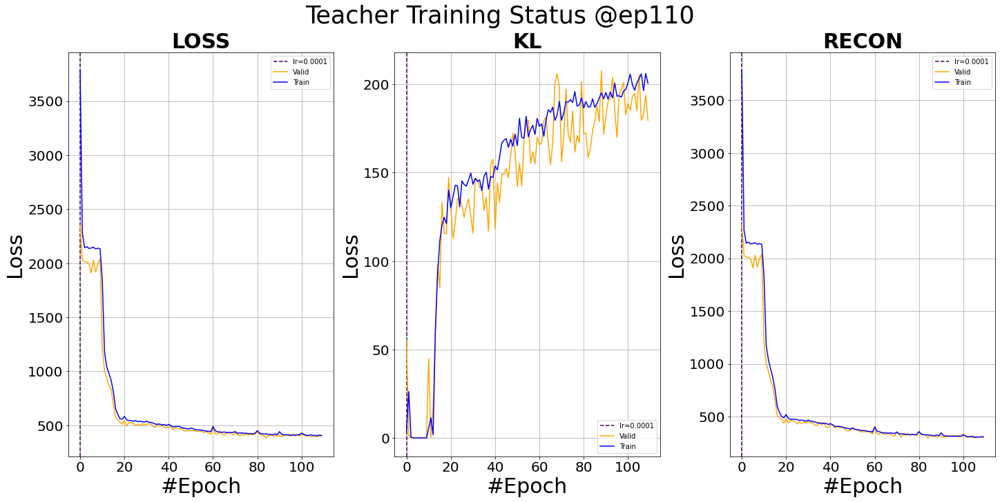

<Figure size 1440x720 with 0 Axes>

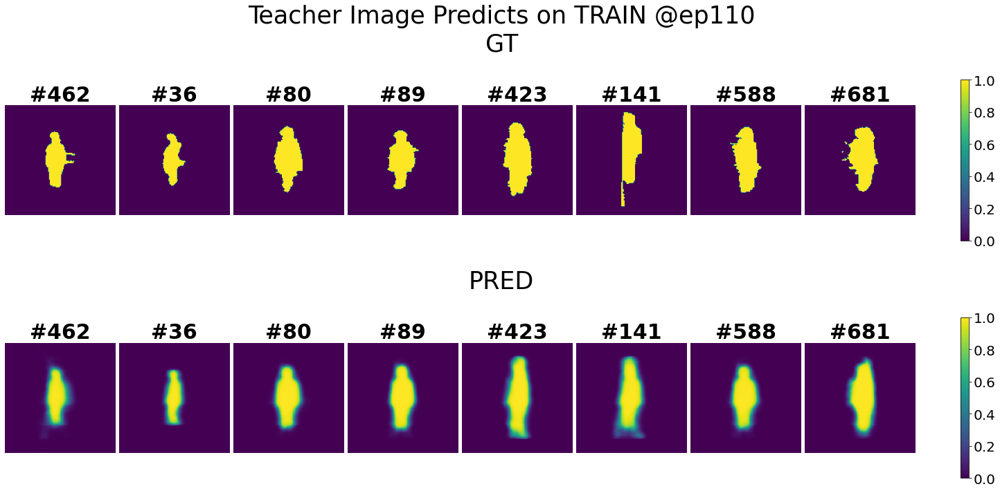

<Figure size 1440x720 with 0 Axes>

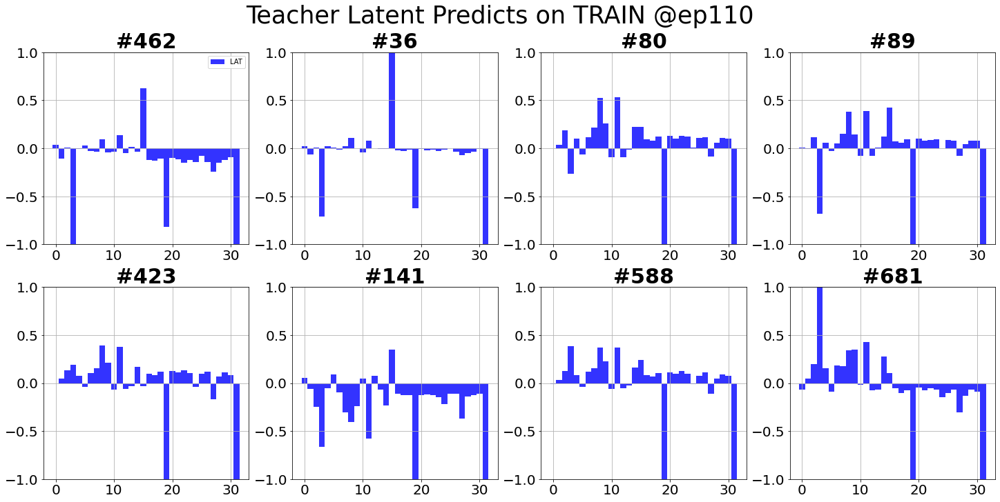

Teacher valid: epoch=9/10, batch=0/3, current best valid loss=366.7417        =366.7417    
Total training time: 49.030906677246094 sec
Teacher test: sample=10/15, loss=156.6956    
Test finished. Average loss={'LOSS': 305.9168478727341, 'KL': 3.1268639942010243, 'RECON': 304.3534159501394}

Total training time: 4.965906143188477 sec


<Figure size 1440x720 with 0 Axes>

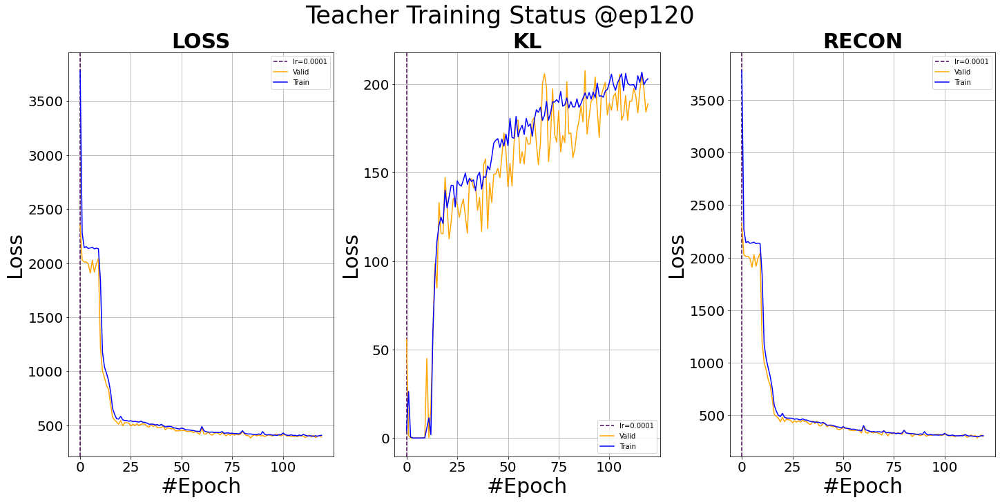

<Figure size 1440x720 with 0 Axes>

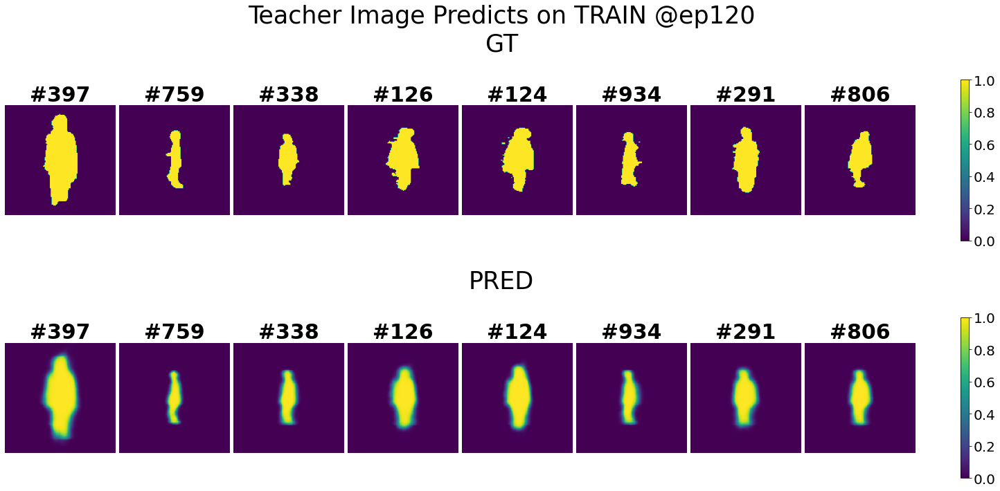

<Figure size 1440x720 with 0 Axes>

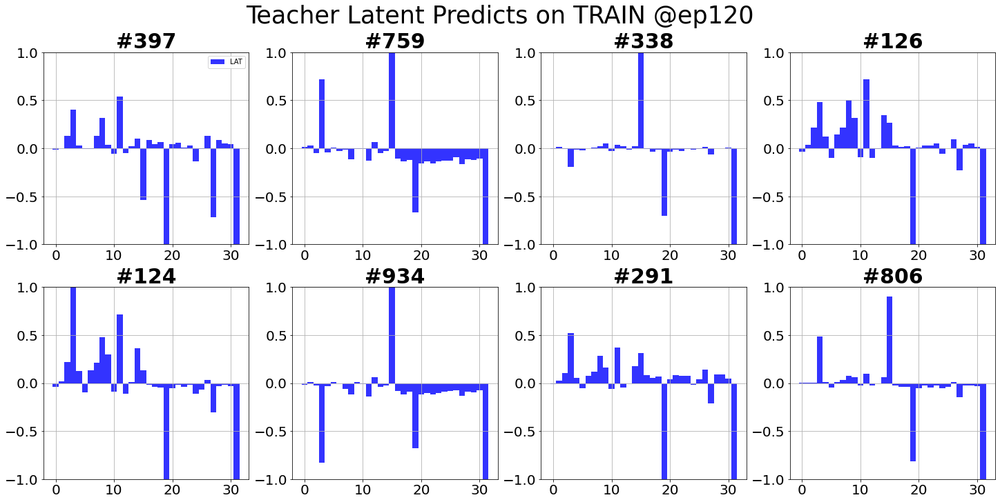

Teacher valid: epoch=9/10, batch=0/3, current best valid loss=366.7417        =366.7417    
Total training time: 49.442769050598145 sec
Teacher test: sample=10/15, loss=654.1013    
Test finished. Average loss={'LOSS': 290.3458620468775, 'KL': 3.4416303926457963, 'RECON': 288.6250471353531}

Total training time: 4.911972999572754 sec


<Figure size 1440x720 with 0 Axes>

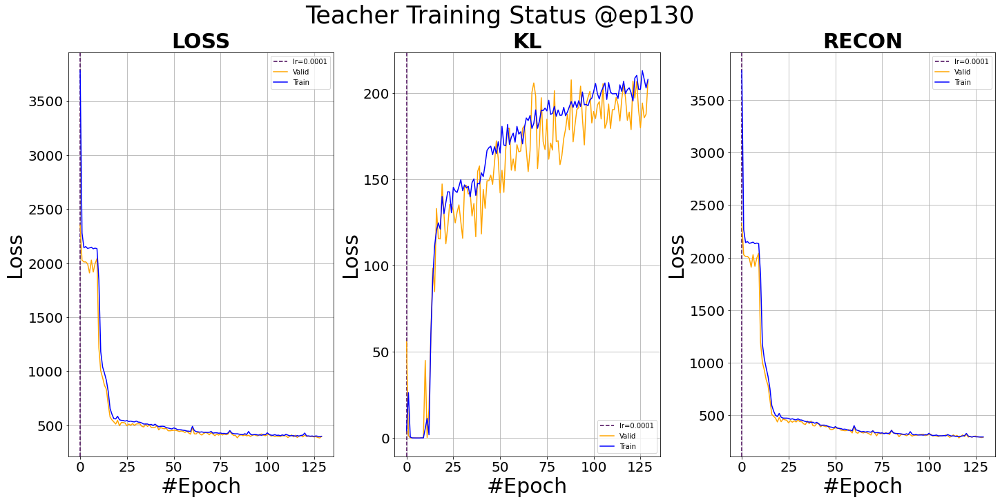

<Figure size 1440x720 with 0 Axes>

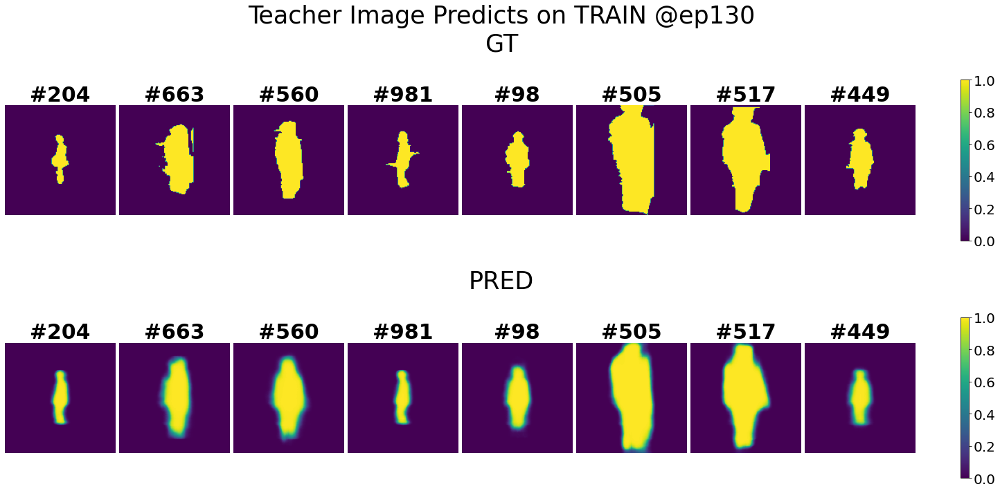

<Figure size 1440x720 with 0 Axes>

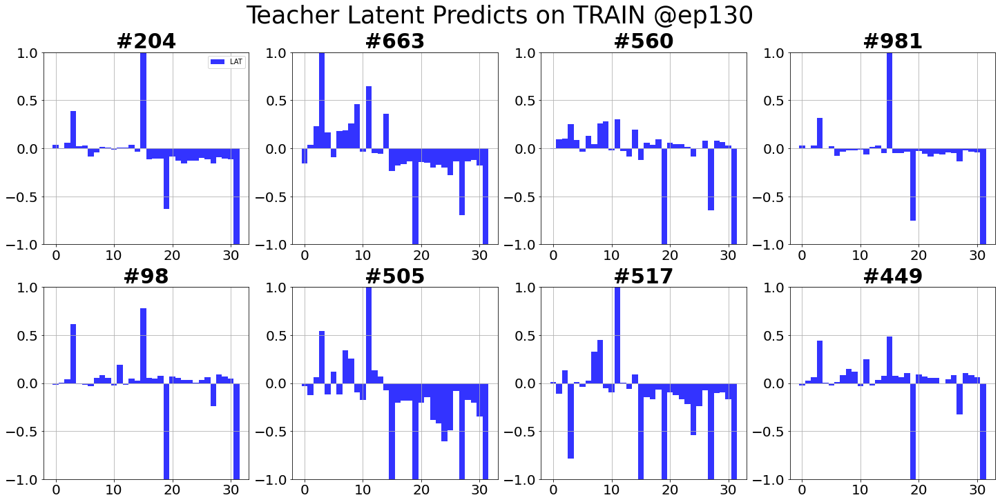

Teacher valid: epoch=9/10, batch=0/3, current best valid loss=362.3170        =362.3170    
Total training time: 49.186503171920776 sec
Teacher test: sample=10/15, loss=311.0227    
Test finished. Average loss={'LOSS': 278.4530918598175, 'KL': 3.4408157357325155, 'RECON': 276.73268418312074}

Total training time: 4.931448221206665 sec


<Figure size 1440x720 with 0 Axes>

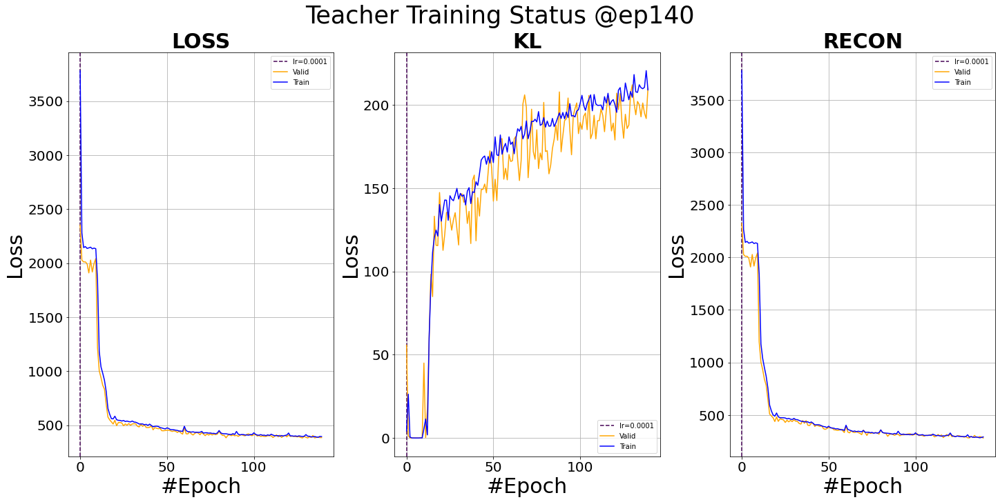

<Figure size 1440x720 with 0 Axes>

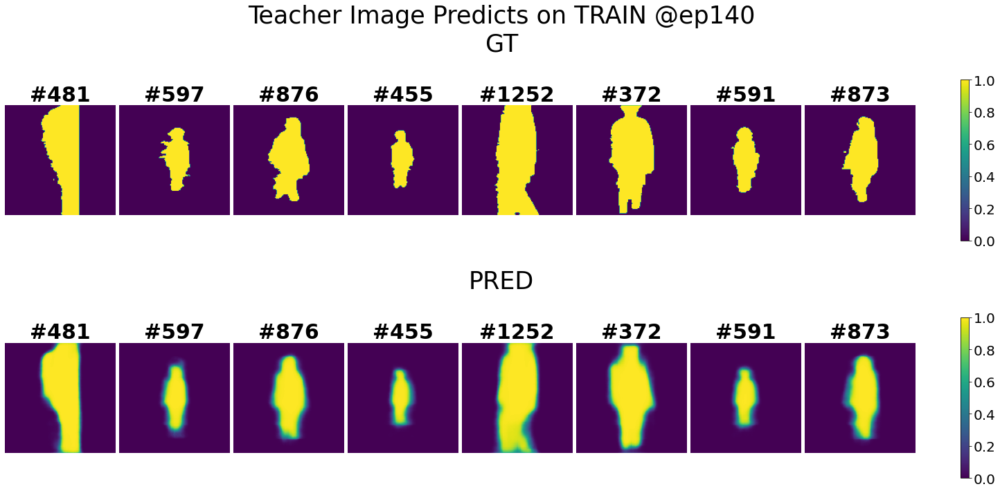

<Figure size 1440x720 with 0 Axes>

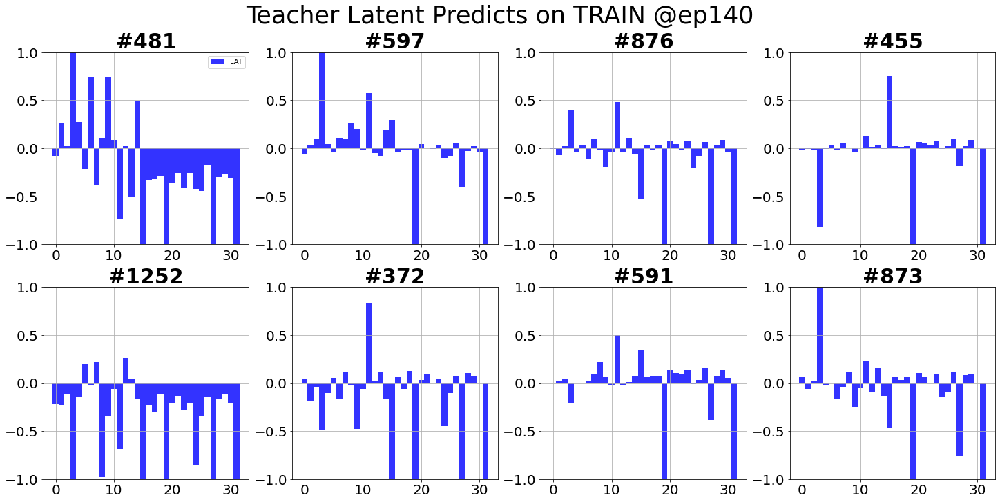

Teacher valid: epoch=9/10, batch=0/3, current best valid loss=360.0802        =360.0802    
Total training time: 50.986427783966064 sec
Teacher test: sample=10/15, loss=417.1420    
Test finished. Average loss={'LOSS': 280.11835532188417, 'KL': 3.4096895799040796, 'RECON': 278.41351075172423}

Total training time: 5.028881549835205 sec


<Figure size 1440x720 with 0 Axes>

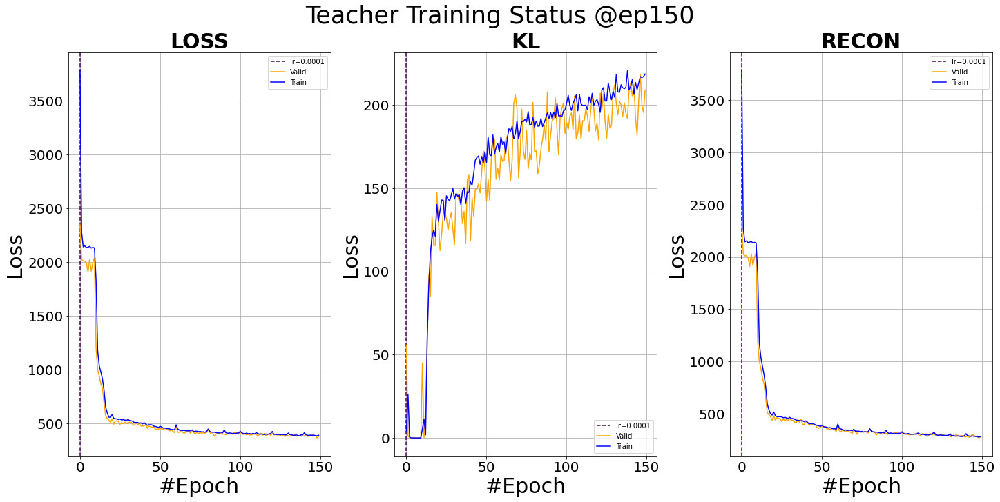

<Figure size 1440x720 with 0 Axes>

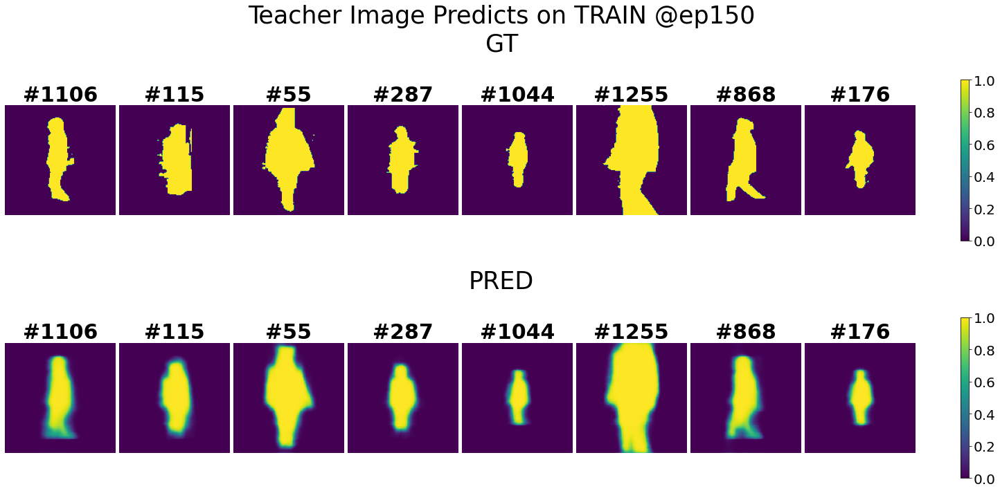

<Figure size 1440x720 with 0 Axes>

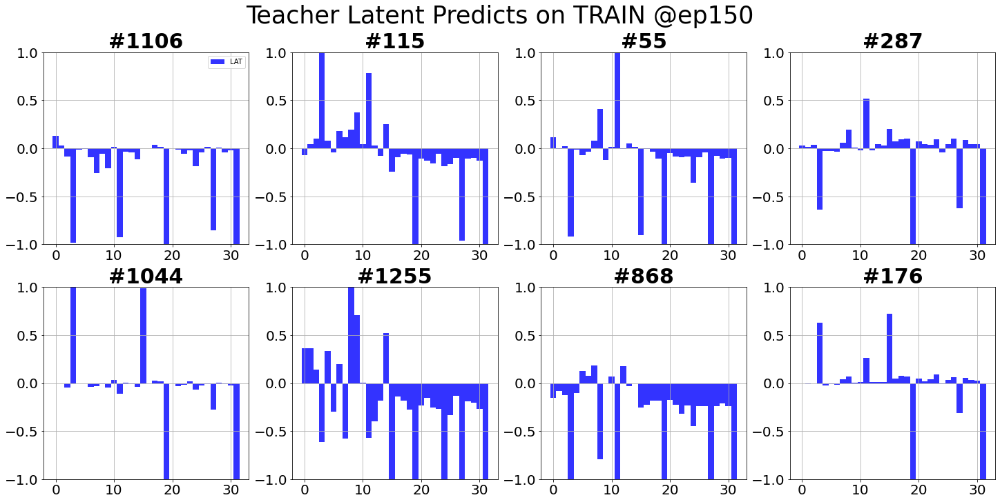

Teacher valid: epoch=9/10, batch=0/3, current best valid loss=360.0802        =360.0802    
Total training time: 49.35421013832092 sec
Teacher test: sample=10/15, loss=352.1256    
Test finished. Average loss={'LOSS': 275.47973120212555, 'KL': 3.444414661824703, 'RECON': 273.75752391020455}

Total training time: 5.030165672302246 sec


<Figure size 1440x720 with 0 Axes>

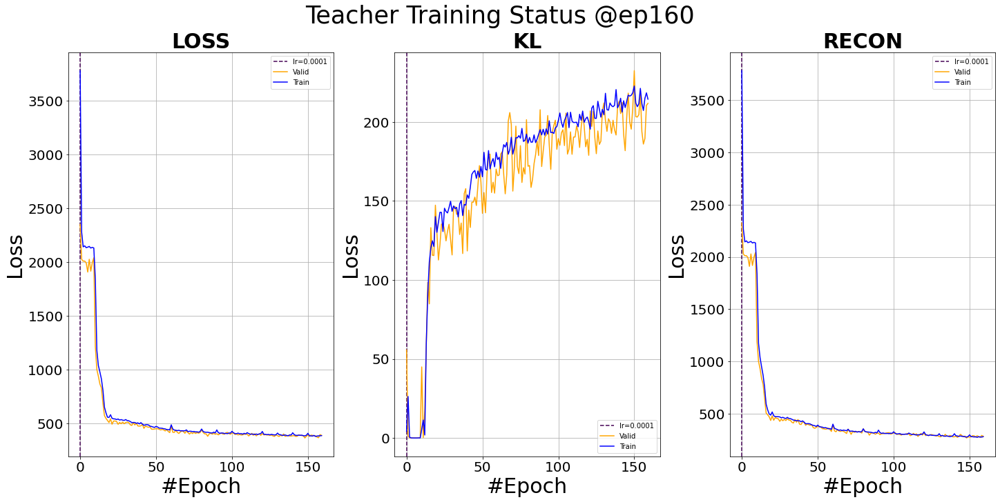

<Figure size 1440x720 with 0 Axes>

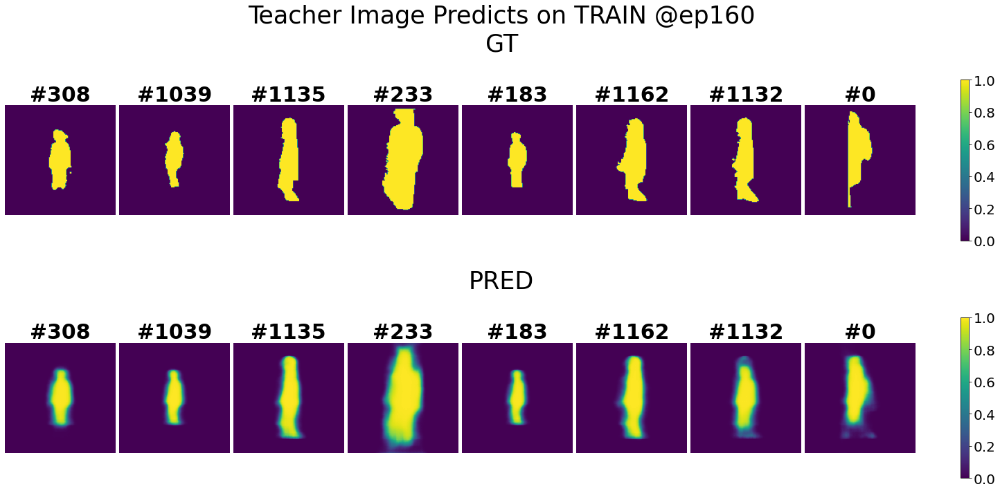

<Figure size 1440x720 with 0 Axes>

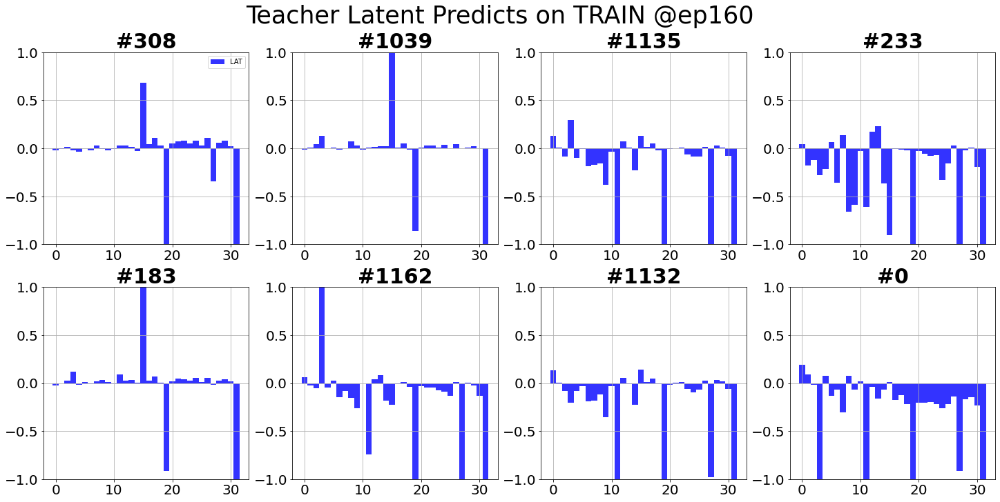

Teacher valid: epoch=9/10, batch=0/3, current best valid loss=360.0802        =360.0802    
Total training time: 50.26398539543152 sec
Teacher test: sample=10/15, loss=241.6010    
Test finished. Average loss={'LOSS': 271.2818320671717, 'KL': 3.447934238240123, 'RECON': 269.55786476929984}

Total training time: 4.977901935577393 sec


<Figure size 1440x720 with 0 Axes>

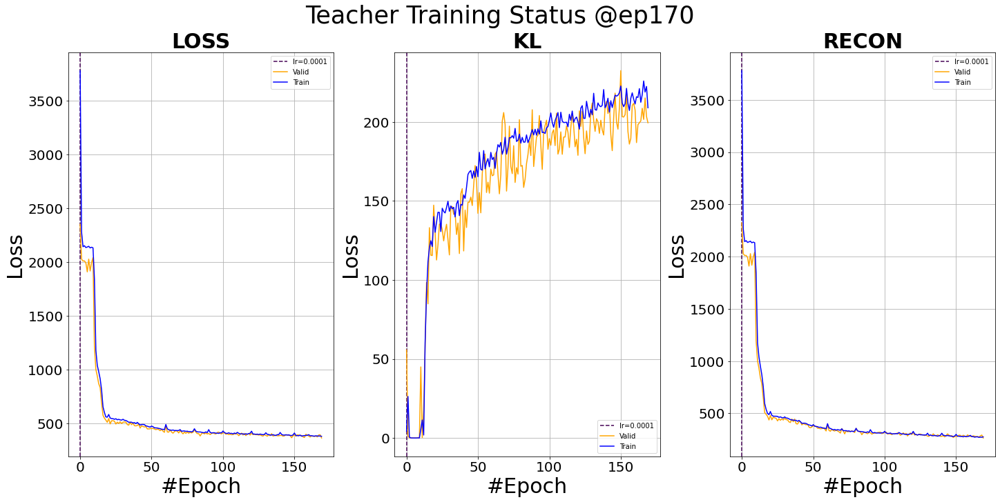

<Figure size 1440x720 with 0 Axes>

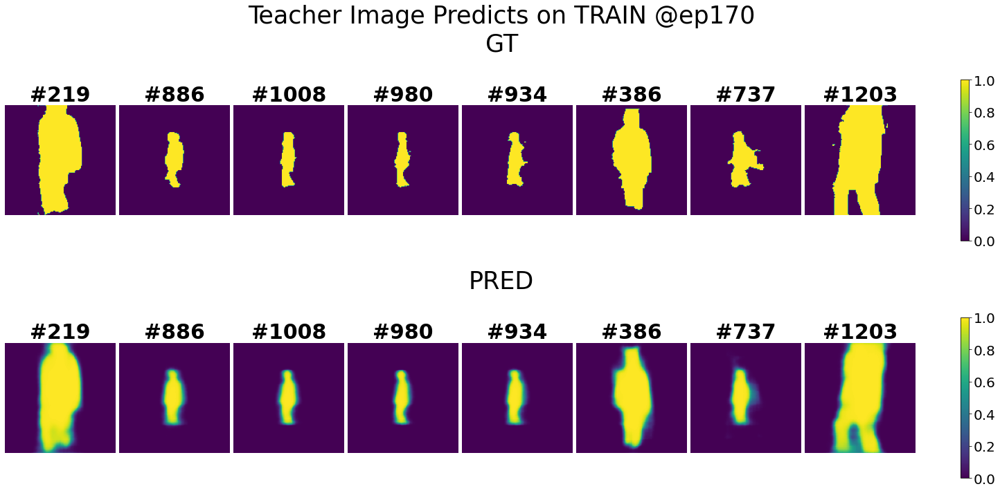

<Figure size 1440x720 with 0 Axes>

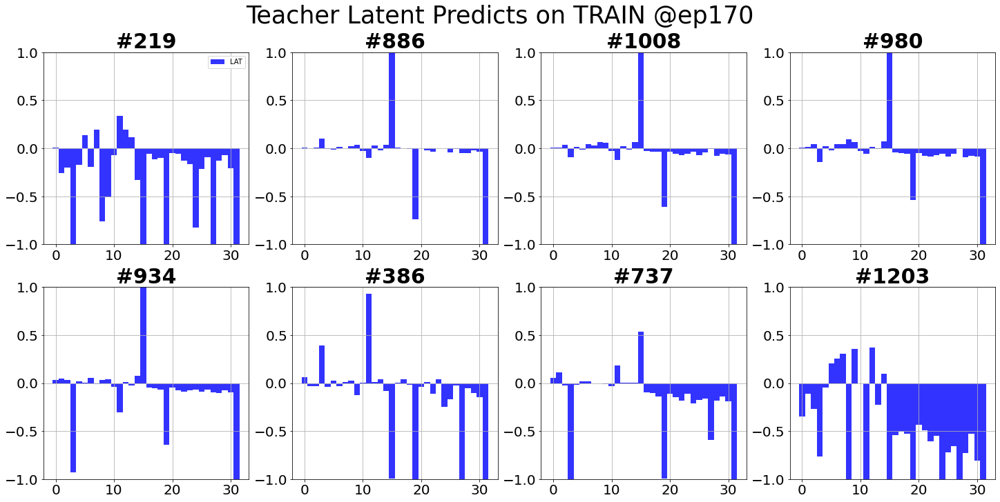

Teacher valid: epoch=9/10, batch=0/3, current best valid loss=360.0802        =360.0802    
Total training time: 49.30554938316345 sec
Teacher test: sample=10/15, loss=356.8081    
Test finished. Average loss={'LOSS': 269.3228821118673, 'KL': 3.400584090376894, 'RECON': 267.6225900173187}

Total training time: 4.9674460887908936 sec


<Figure size 1440x720 with 0 Axes>

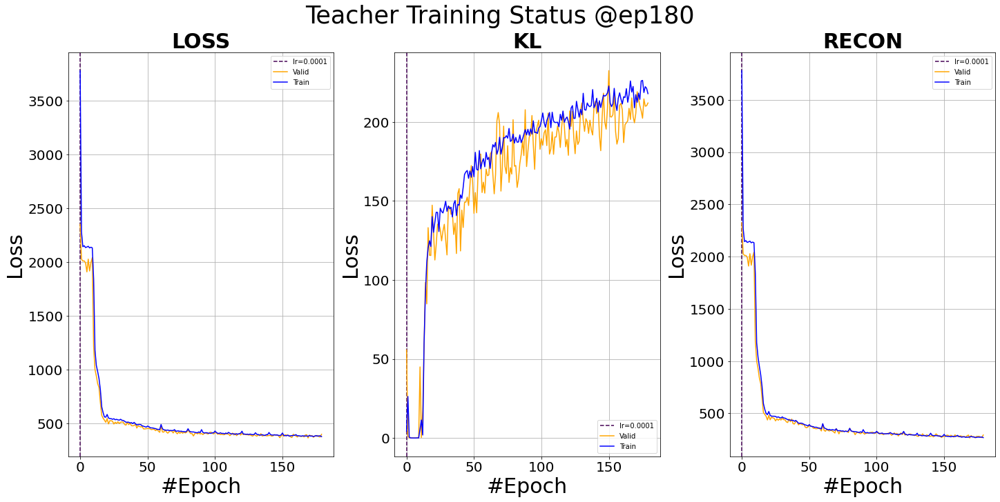

<Figure size 1440x720 with 0 Axes>

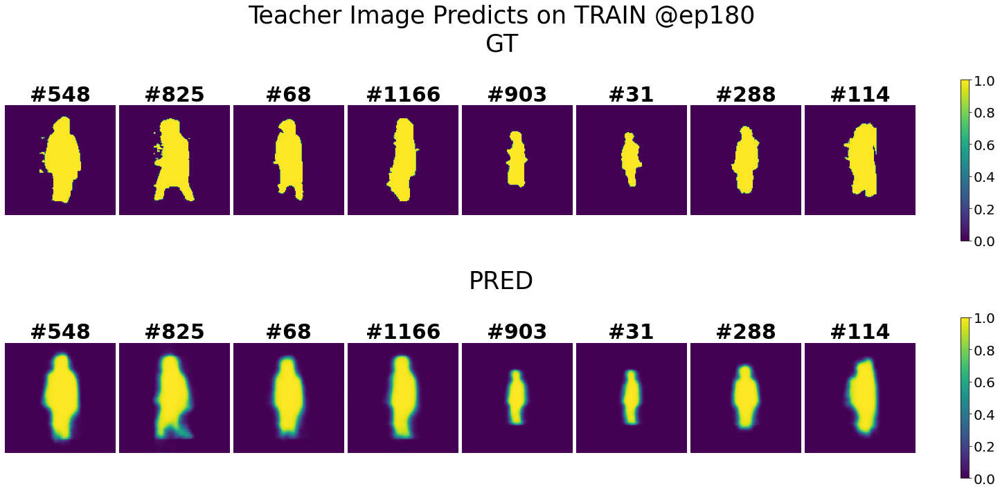

<Figure size 1440x720 with 0 Axes>

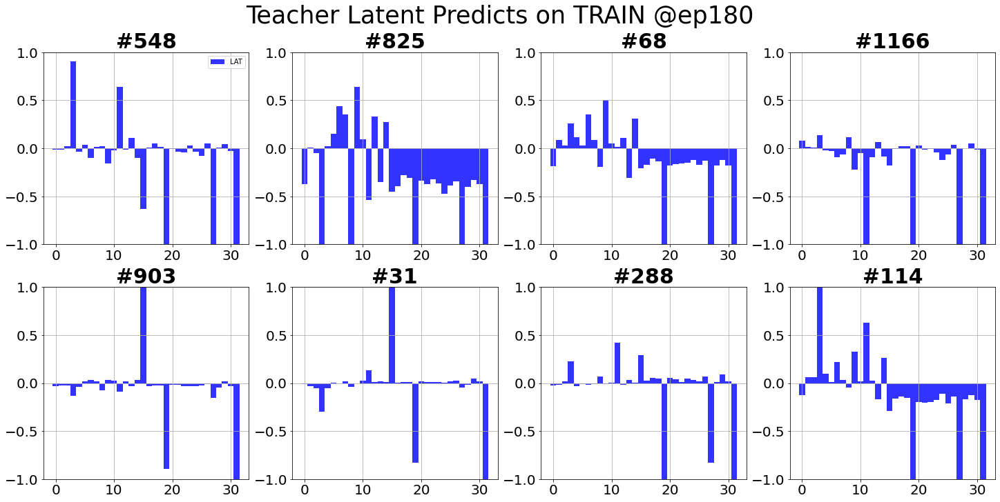

Teacher valid: epoch=9/10, batch=0/3, current best valid loss=348.2068        =348.2068    
Total training time: 49.87620687484741 sec
Teacher test: sample=10/15, loss=425.6569    
Test finished. Average loss={'LOSS': 263.31378479798633, 'KL': 3.5777397158245248, 'RECON': 261.5249148050944}

Total training time: 4.915942192077637 sec


<Figure size 1440x720 with 0 Axes>

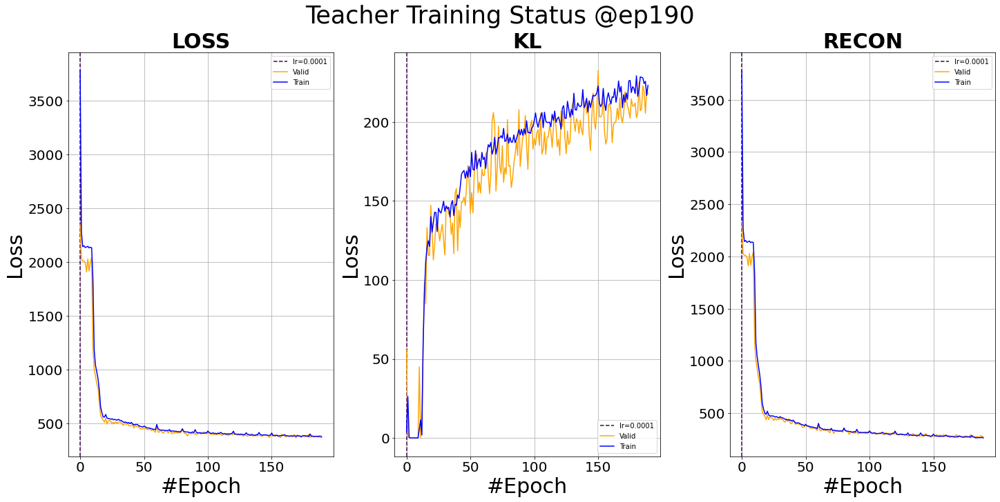

<Figure size 1440x720 with 0 Axes>

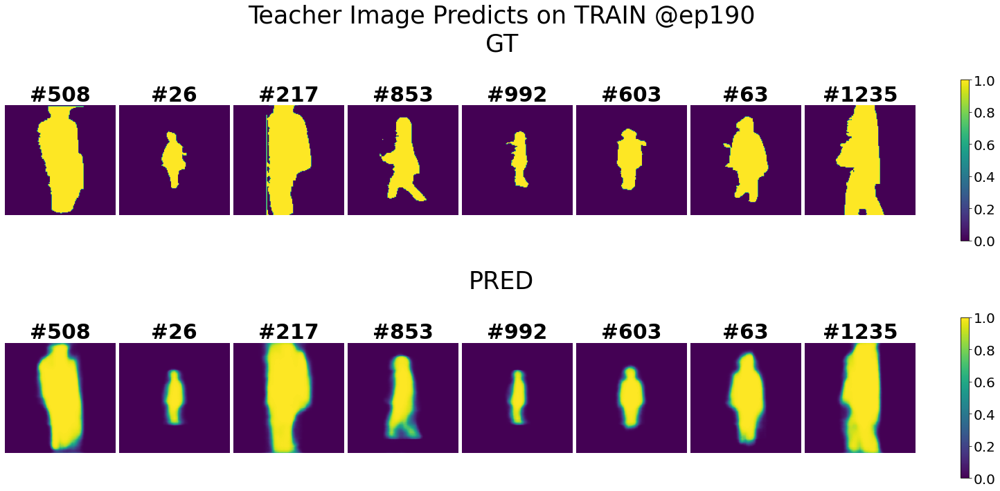

<Figure size 1440x720 with 0 Axes>

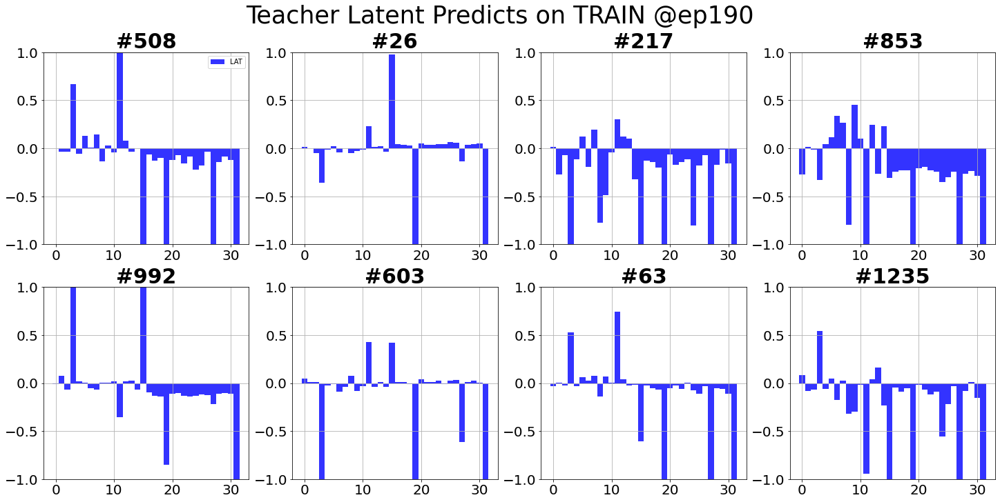

Teacher valid: epoch=9/10, batch=0/3, current best valid loss=348.2068        =348.2068    
Total training time: 49.47985816001892 sec
Teacher test: sample=10/15, loss=257.2715    
Test finished. Average loss={'LOSS': 258.8277511994044, 'KL': 3.642240189636747, 'RECON': 257.0066312154134}

Total training time: 4.980345726013184 sec


<Figure size 1440x720 with 0 Axes>

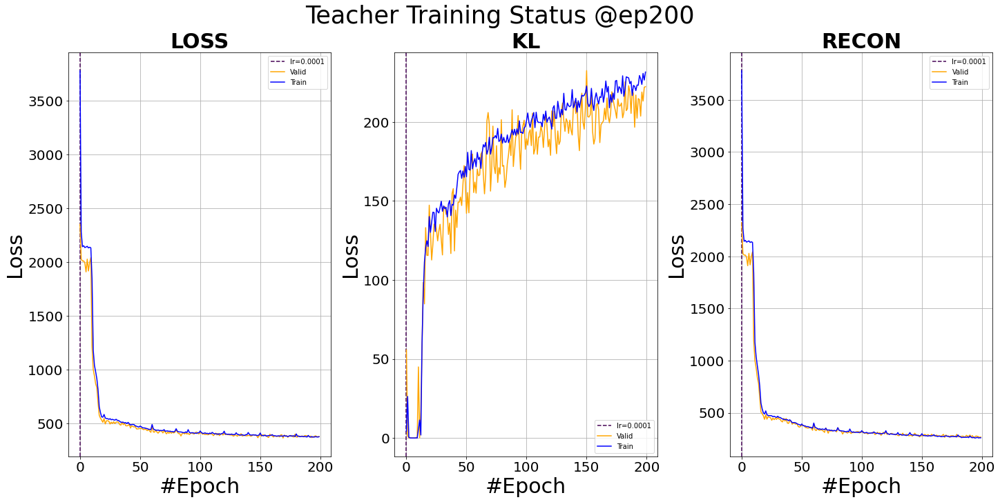

<Figure size 1440x720 with 0 Axes>

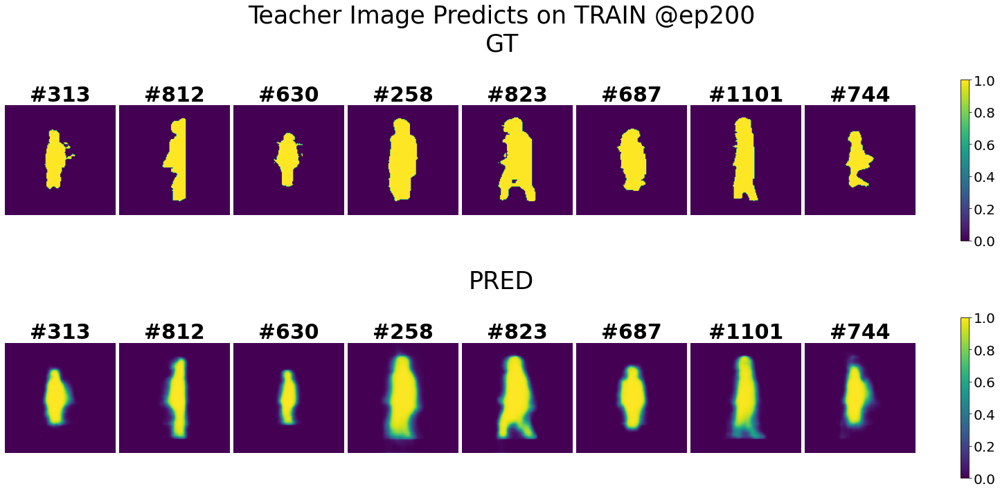

<Figure size 1440x720 with 0 Axes>

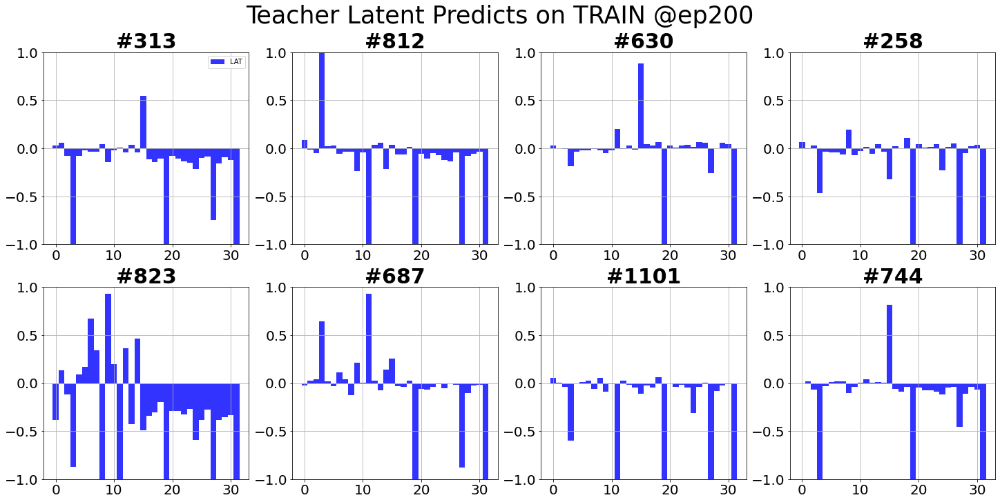


Schedule Completed!


In [8]:
### Scheduler
%matplotlib inline
#trainer1.lr=1e-5
T_trainer.scheduler(turns=10,
                  test_loader='train', select_num=8,
                  autosave=True, notion=f"{date}_{run}", save_model=False)

/home/bob/.local/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py:172: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:199.)
  return collate([torch.as_tensor(b) for b in batch], collate_fn_map=collate_fn_map)
/home/bob/.local/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py:172: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest 

Teacher test: sample=9285/9290, loss=1121.2916    
Test finished. Average loss={'LOSS': 408.8516753969716, 'KL': 3.7918254400736804, 'RECON': 406.95576291202343}

Total training time: 68.09710502624512 sec


<Figure size 1440x720 with 0 Axes>

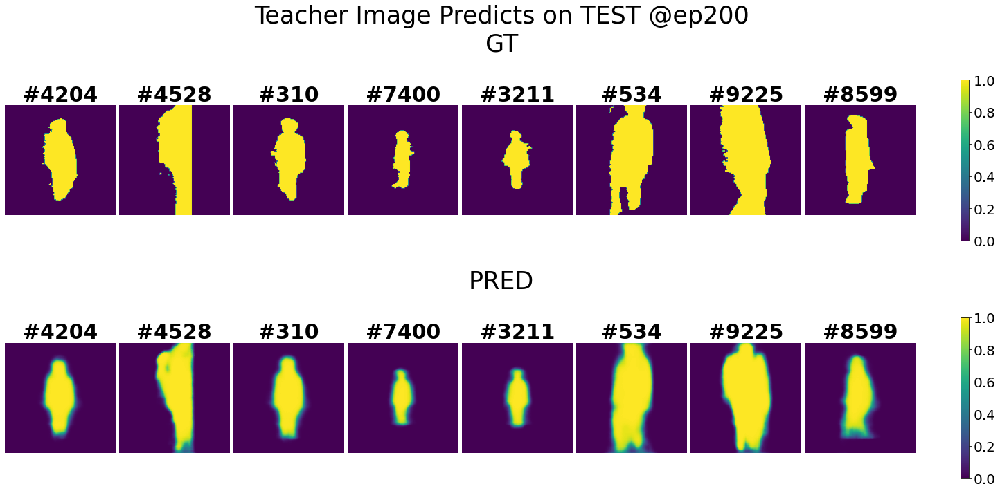

<Figure size 1440x720 with 0 Axes>

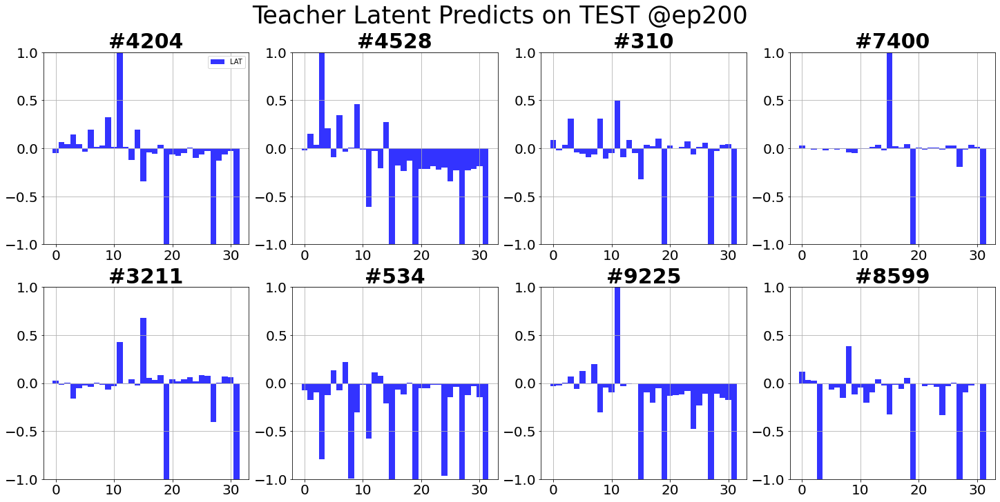

In [9]:
T_trainer.test(loader='test')
T_trainer.plot_test(select_num=8, autosave=True, notion=f"{date}_{run}")

In [64]:
T_trainer.save(f"{date}_{run}")

Saving models...
Saving imgen...
Saving imgde...
All saved!


### Student

#### Train

In [5]:
torch.cuda.set_device(gpu)
csiencoder = TP.CSIEncoder(lstm_steps=225)
bbxdecoder = TP.BBXDecoder()
imgencoder = TP.ImageEncoder(latent_dim=16)
imgdecoder = TP.ImageDecoder(latent_dim=16)
imgencoder.load_state_dict(torch.load(f"../saved/240425_{run}/240425_{run}_Teacher_IMGENV07C1@ep300.pth"))
imgdecoder.load_state_dict(torch.load(f"../saved/240425_{run}/240425_{run}_Teacher_IMGDEV07C1@ep300.pth"))

S_trainer = TP.StudentTrainer(
                              name='Student', mask=True,
    networks=[csiencoder, bbxdecoder, imgencoder, imgdecoder],
#    networks=[csiencoder, bbxdecoder, T_trainer.models['imgen'], T_trainer.models['imgde']],
                 lr=1e-4, epochs=10, cuda=gpu,
                 train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader)

Student valid: epoch=9/10, batch=15/19, current best valid loss=64.0163        4.0163    
Total training time: 1317.0280525684357 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=1.0388    
Test finished. Average loss={'LOSS': 1.069801439107819, 'MU': 0.07345539739092943, 'LOGVAR': 0.05352623181388422, 'BBX': 1.0000180294374368, 'DPT': 3.138441602227265e-05, 'IMG': 0.026246330588557094}

Total training time: 98.60460329055786 sec


<Figure size 432x288 with 0 Axes>

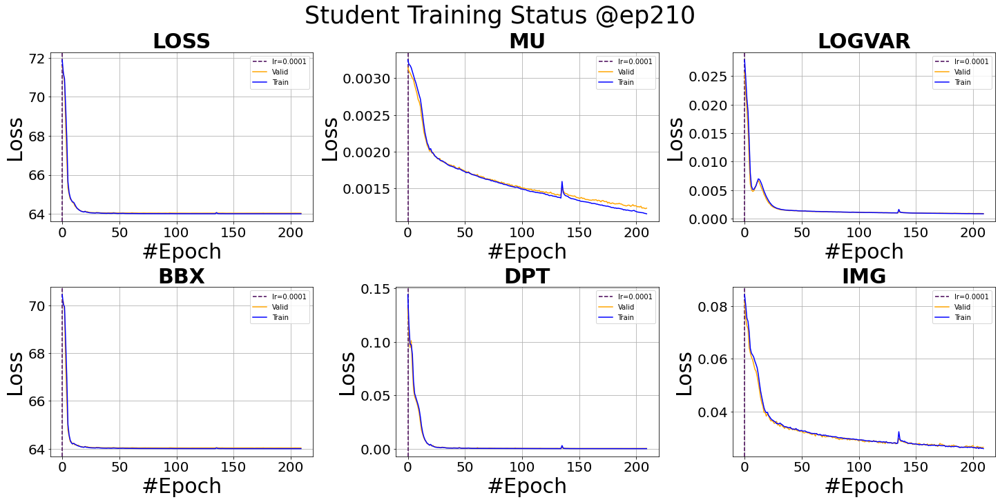

<Figure size 1440x720 with 0 Axes>

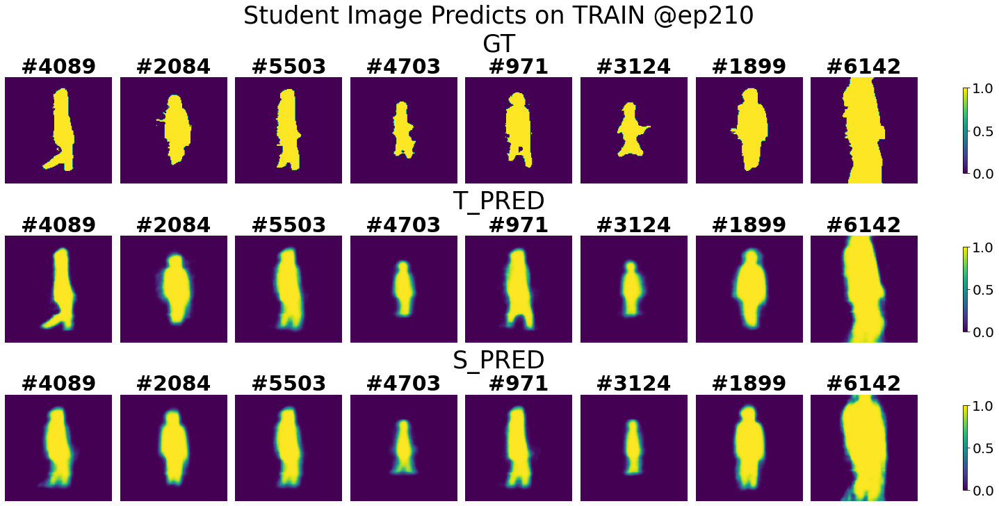

<Figure size 1440x720 with 0 Axes>

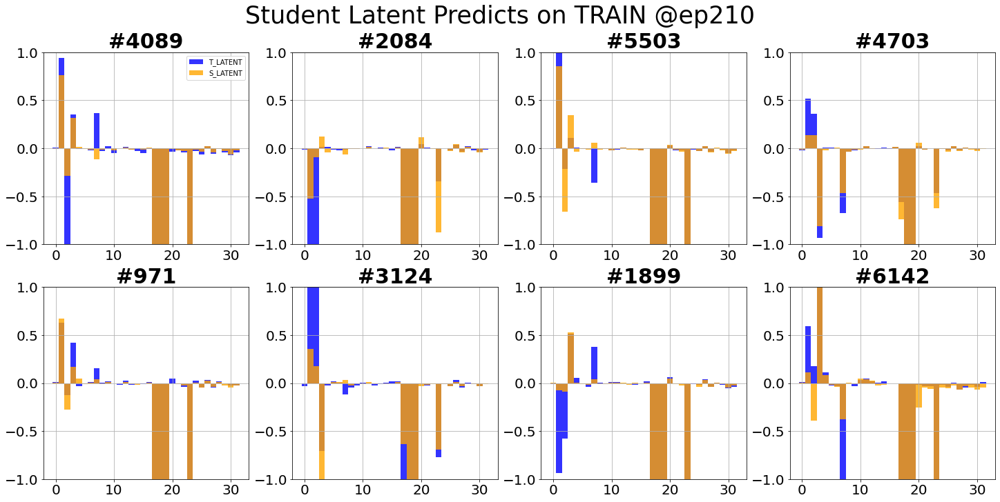

<Figure size 1440x720 with 0 Axes>

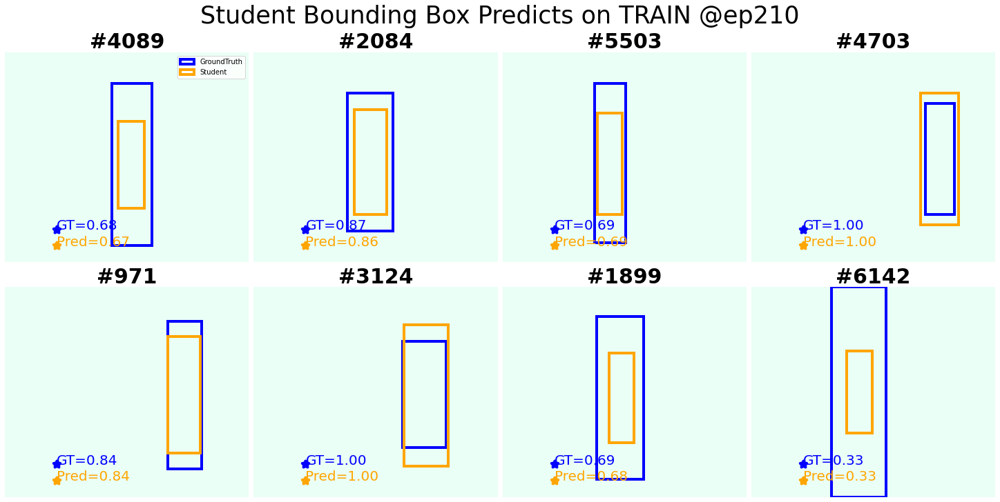

<Figure size 1440x720 with 0 Axes>

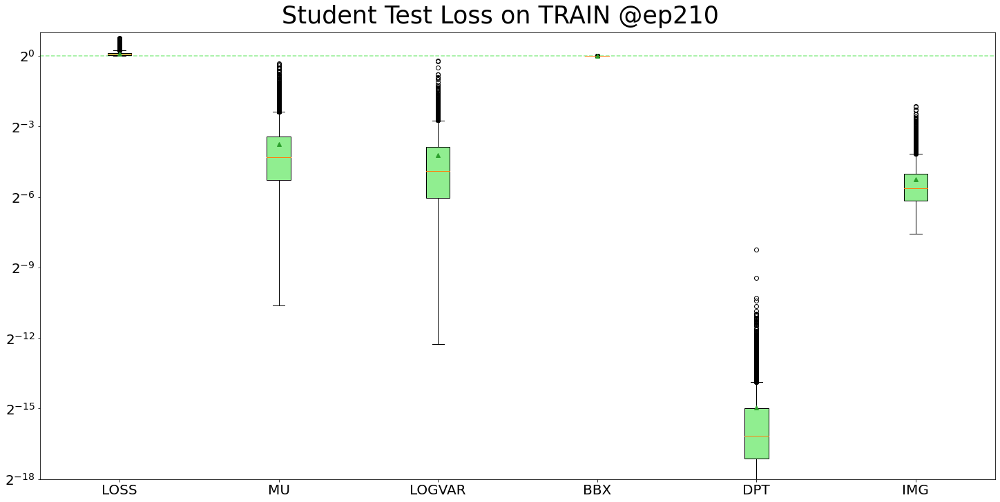

<Figure size 1440x720 with 0 Axes>

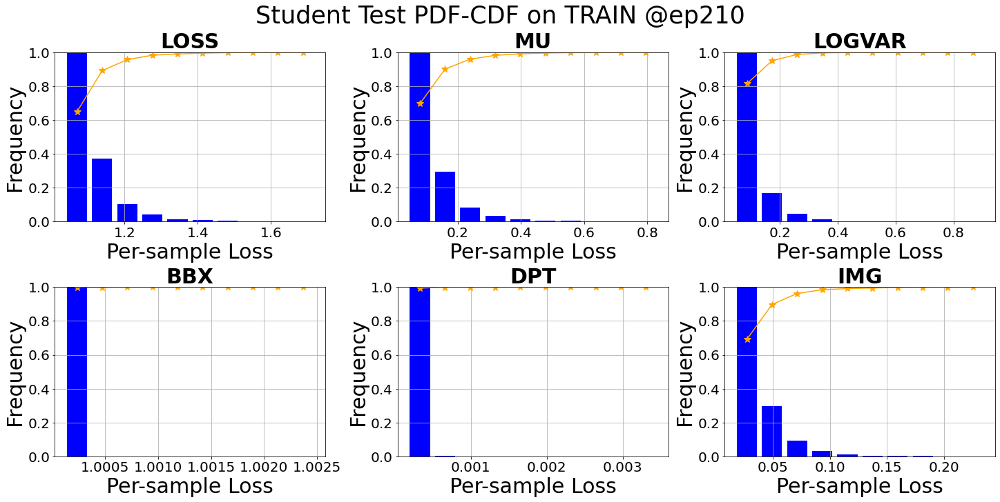

Student valid: epoch=9/10, batch=15/19, current best valid loss=64.0163        4.0163    
Total training time: 1283.1850337982178 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=1.0573    
Test finished. Average loss={'LOSS': 1.0680961640575877, 'MU': 0.071603457286859, 'LOGVAR': 0.052752546932465935, 'BBX': 1.0000172045033473, 'DPT': 2.4568347195383798e-05, 'IMG': 0.02583738896778827}

Total training time: 98.1143171787262 sec


<Figure size 1440x720 with 0 Axes>

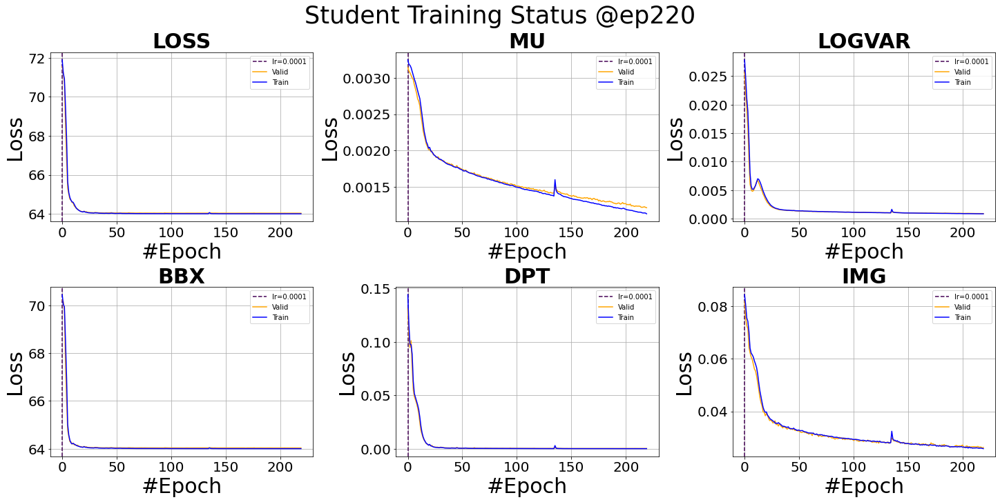

<Figure size 1440x720 with 0 Axes>

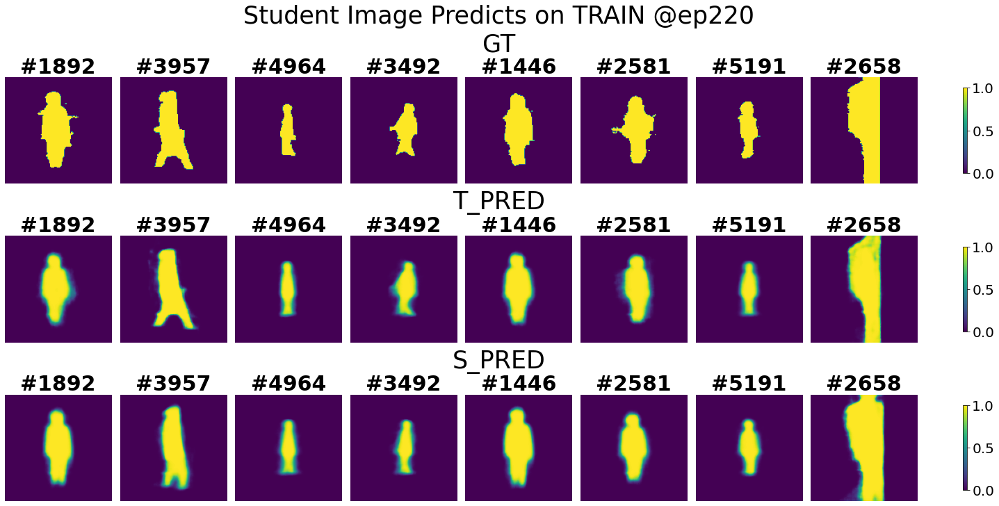

<Figure size 1440x720 with 0 Axes>

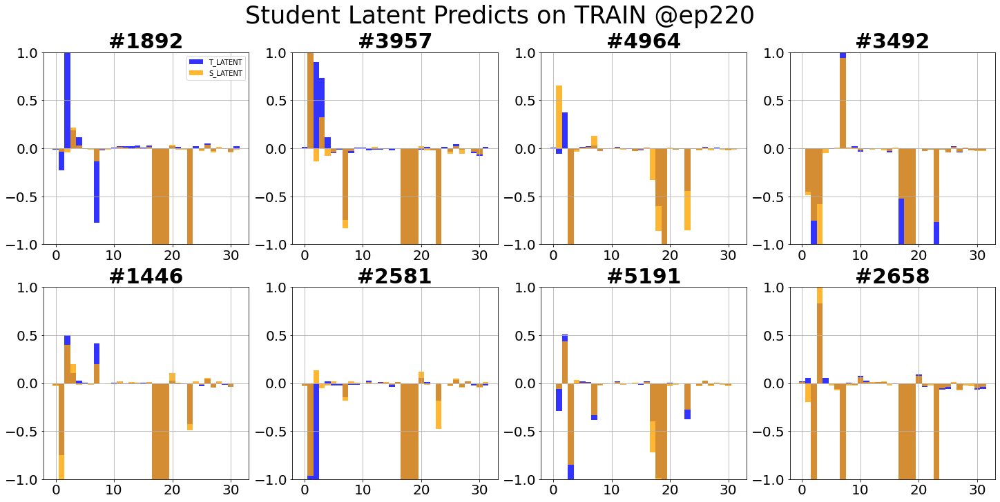

<Figure size 1440x720 with 0 Axes>

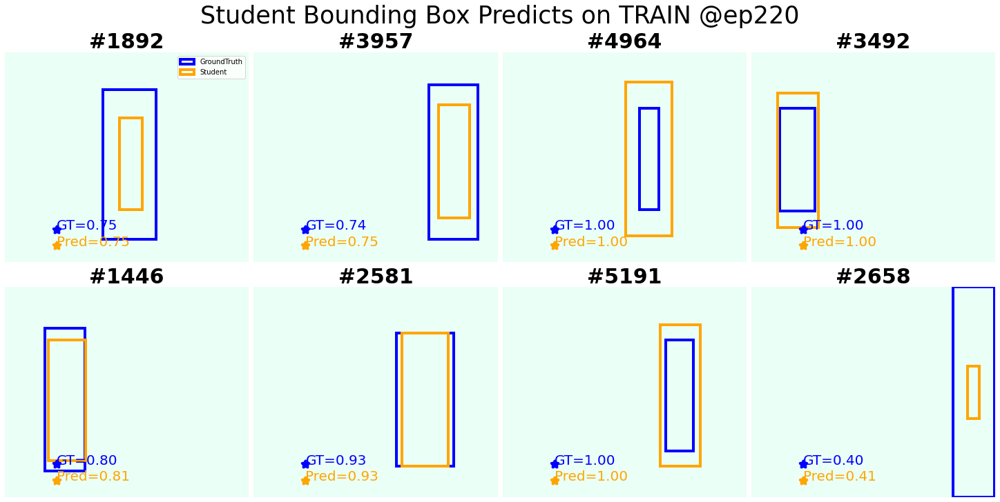

<Figure size 1440x720 with 0 Axes>

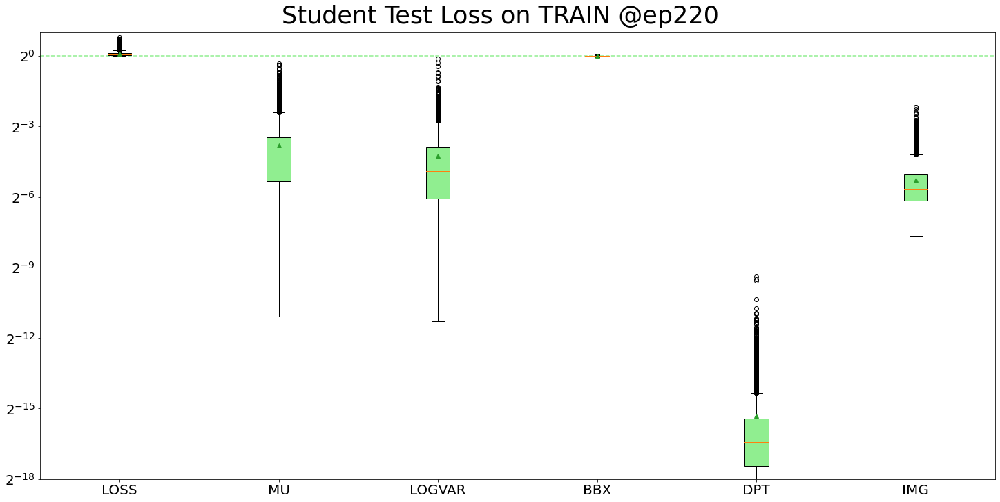

<Figure size 1440x720 with 0 Axes>

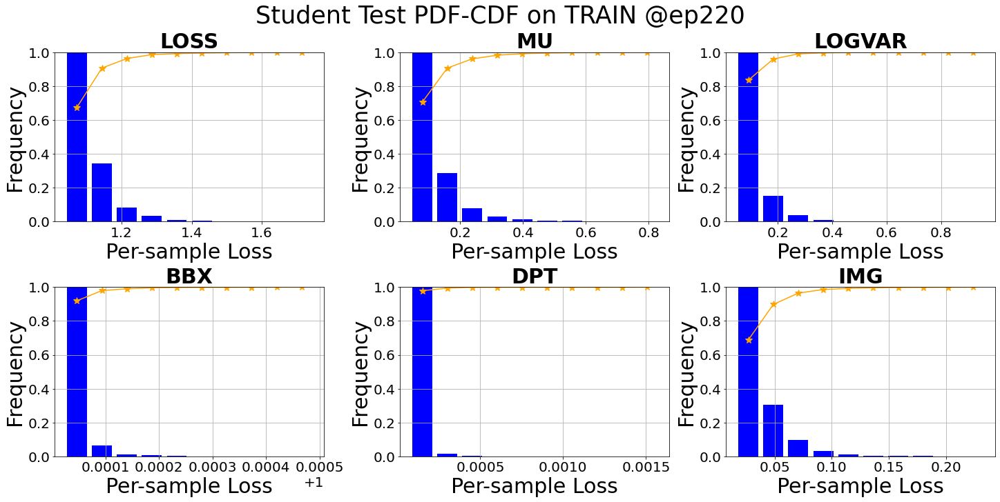

Student valid: epoch=9/10, batch=15/19, current best valid loss=64.0140        4.0140    
Total training time: 1282.8760697841644 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=1.0136    
Test finished. Average loss={'LOSS': 1.0663156104939324, 'MU': 0.0696289107276503, 'LOGVAR': 0.05148120992154057, 'BBX': 1.0000196059367485, 'DPT': 2.9663303025292027e-05, 'IMG': 0.025435084855511284}

Total training time: 98.57743883132935 sec


<Figure size 1440x720 with 0 Axes>

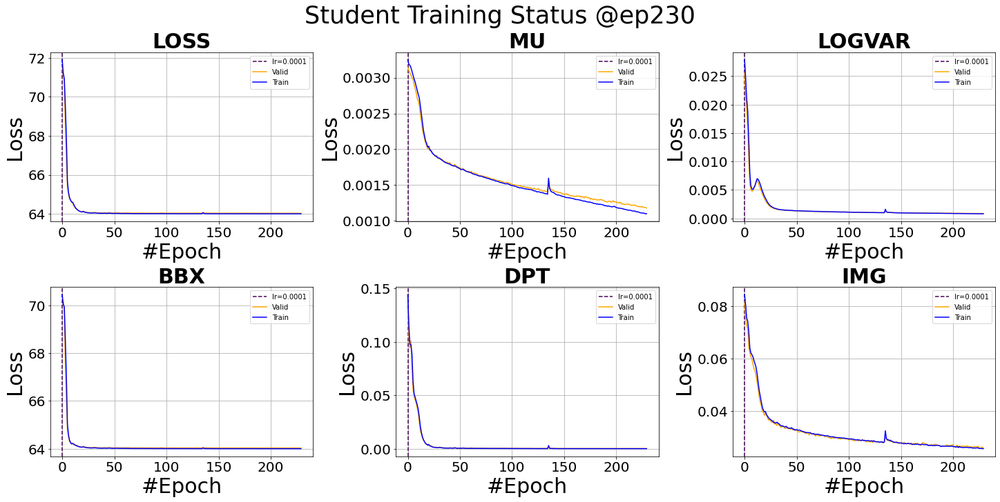

<Figure size 1440x720 with 0 Axes>

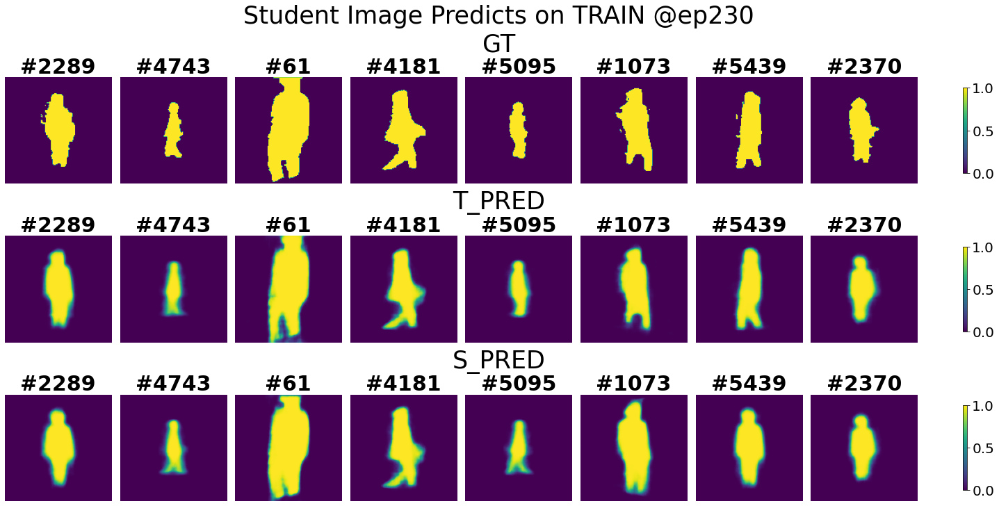

<Figure size 1440x720 with 0 Axes>

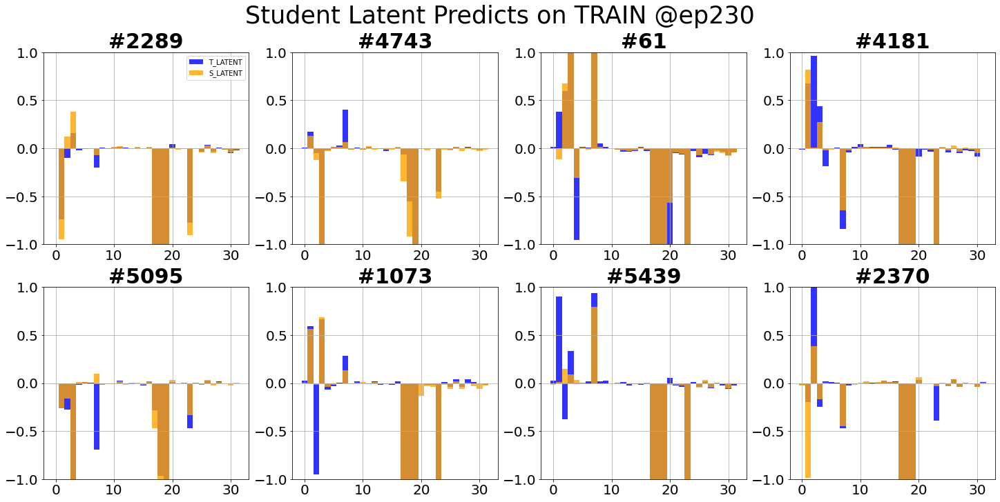

<Figure size 1440x720 with 0 Axes>

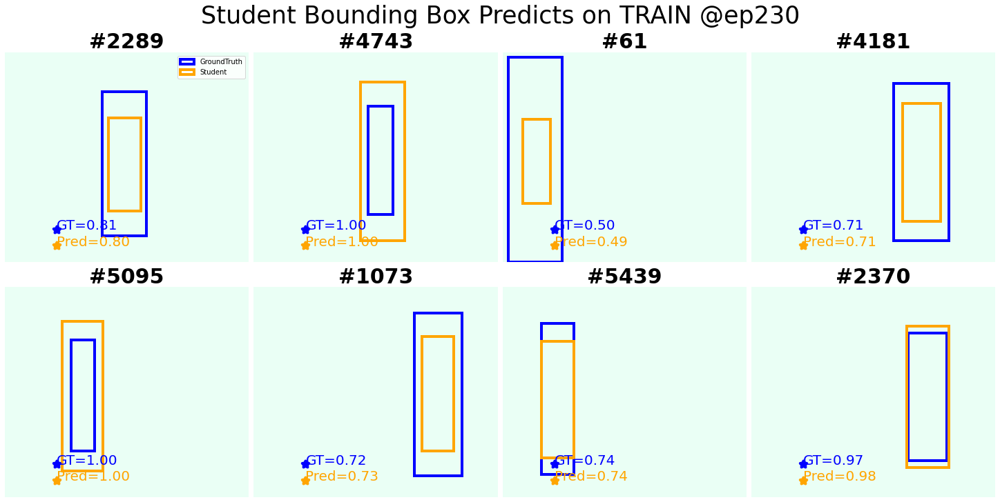

<Figure size 1440x720 with 0 Axes>

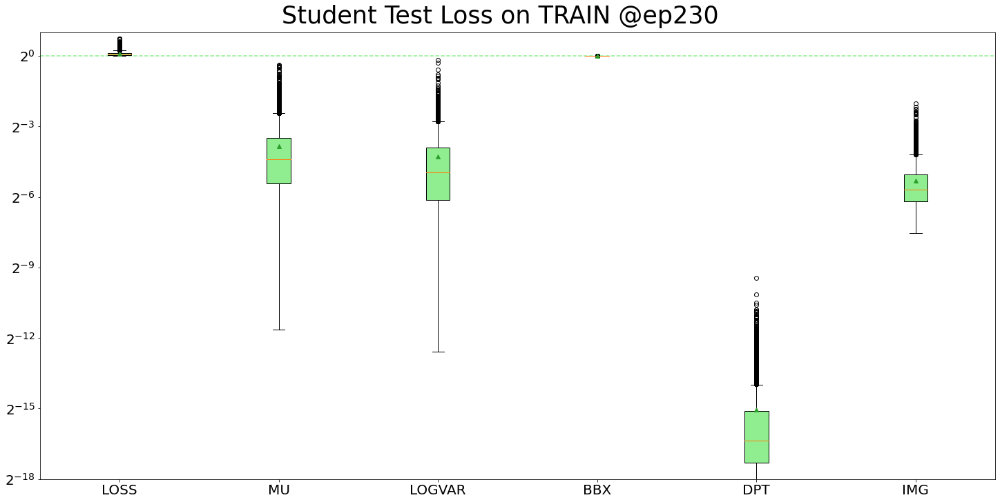

<Figure size 1440x720 with 0 Axes>

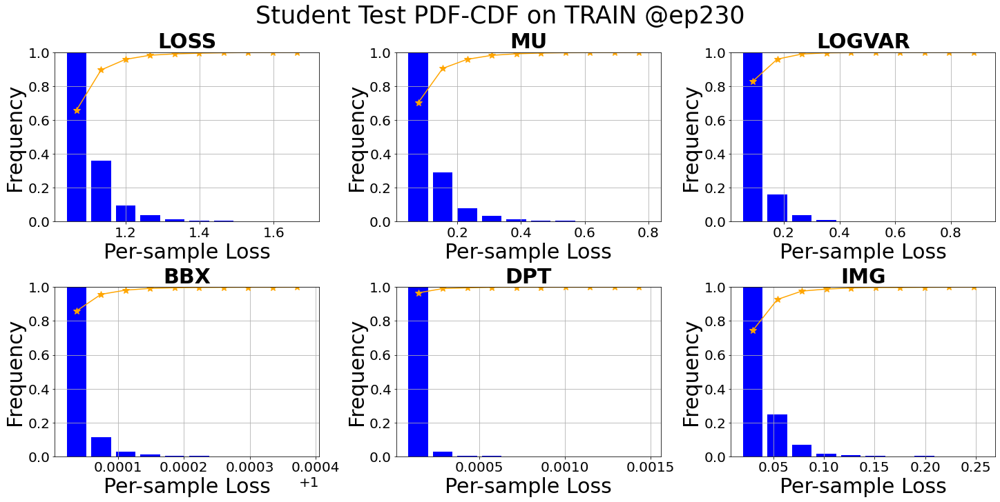

Student valid: epoch=9/10, batch=15/19, current best valid loss=64.0140        4.0140    
Total training time: 1282.5336532592773 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=1.0539    
Test finished. Average loss={'LOSS': 1.0643244163411392, 'MU': 0.06740547041796138, 'LOGVAR': 0.05037591637805141, 'BBX': 1.0000165570769217, 'DPT': 3.08300658010357e-05, 'IMG': 0.02503712164512503}

Total training time: 98.58169317245483 sec


<Figure size 1440x720 with 0 Axes>

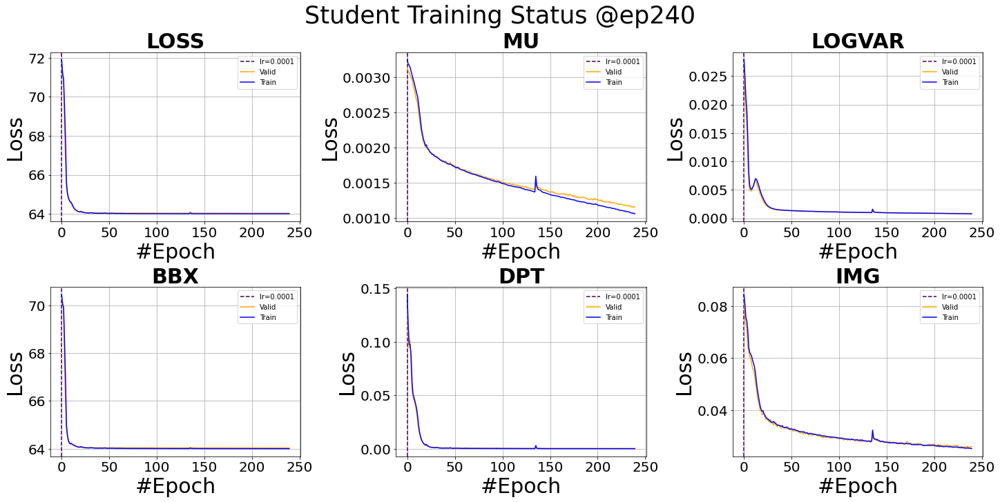

<Figure size 1440x720 with 0 Axes>

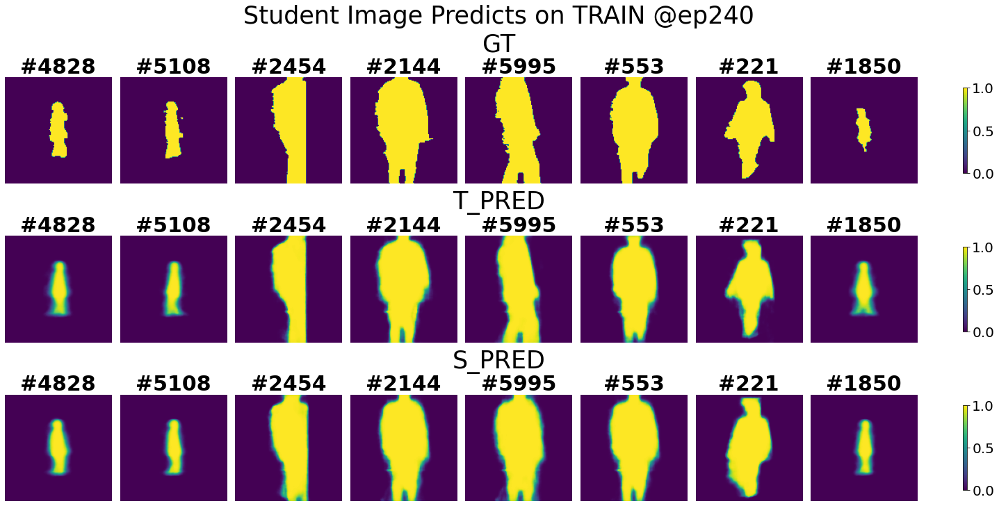

<Figure size 1440x720 with 0 Axes>

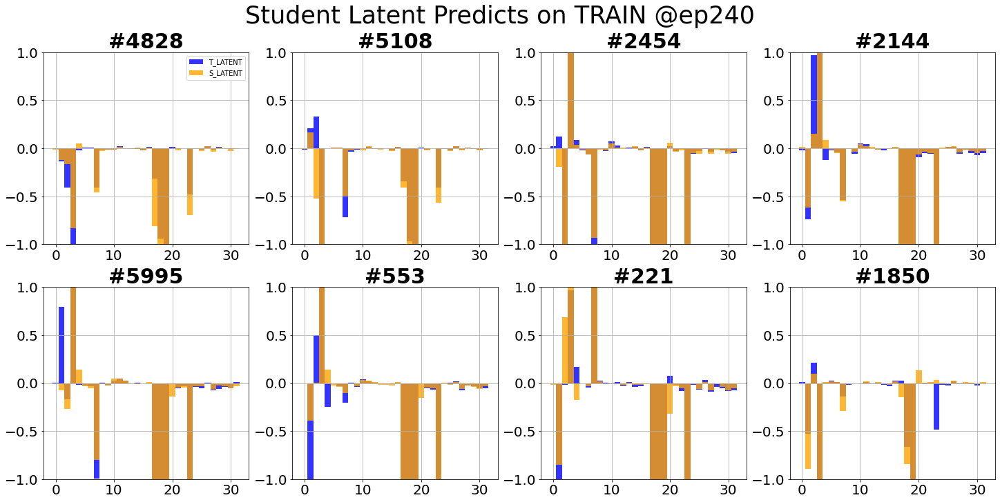

<Figure size 1440x720 with 0 Axes>

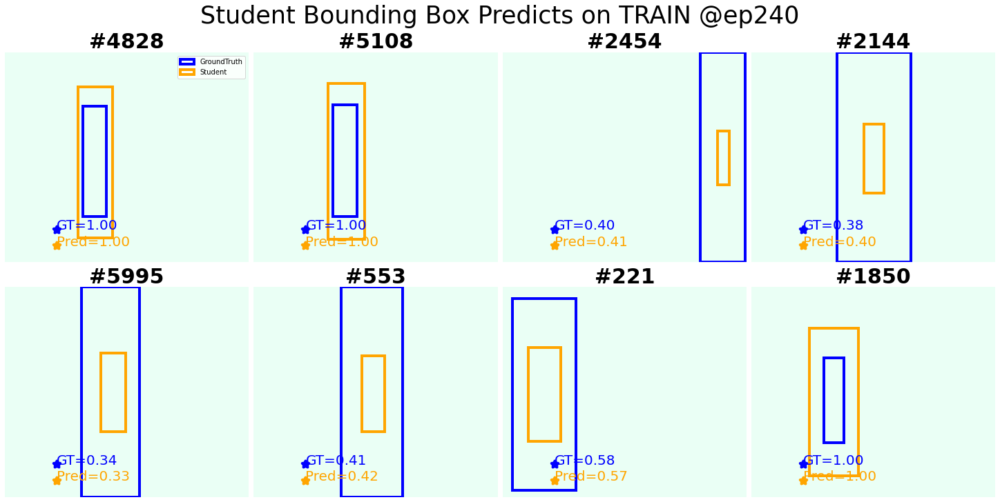

<Figure size 1440x720 with 0 Axes>

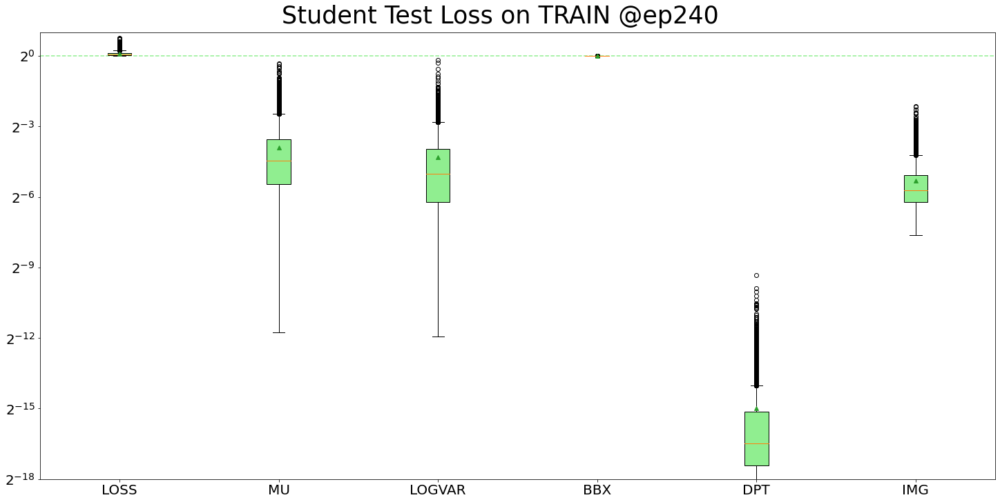

<Figure size 1440x720 with 0 Axes>

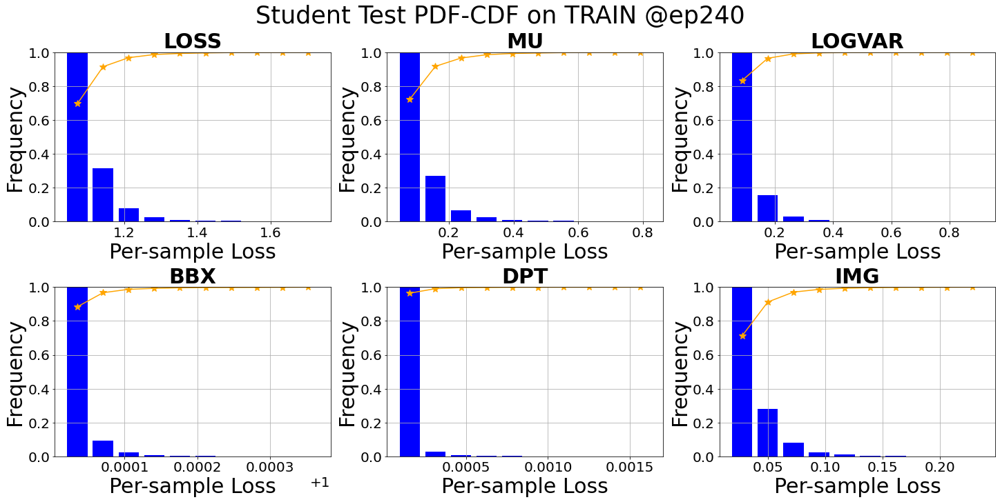

Student valid: epoch=9/10, batch=15/19, current best valid loss=64.0140        4.0140    
Total training time: 1286.0892572402954 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=1.0788    
Test finished. Average loss={'LOSS': 1.063632735329402, 'MU': 0.06660505254376994, 'LOGVAR': 0.04970602930348809, 'BBX': 1.0000299667189647, 'DPT': 3.775202346417146e-05, 'IMG': 0.02534305193552569}

Total training time: 98.13038420677185 sec


<Figure size 1440x720 with 0 Axes>

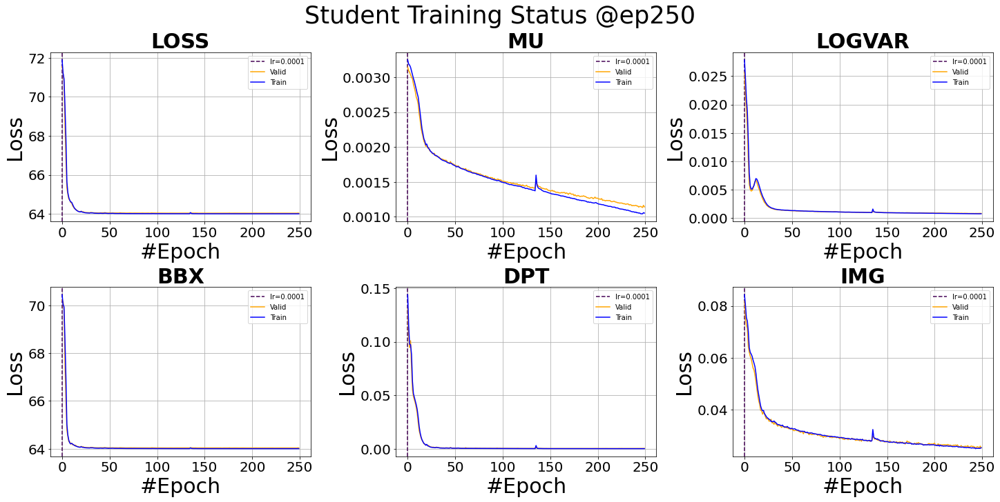

<Figure size 1440x720 with 0 Axes>

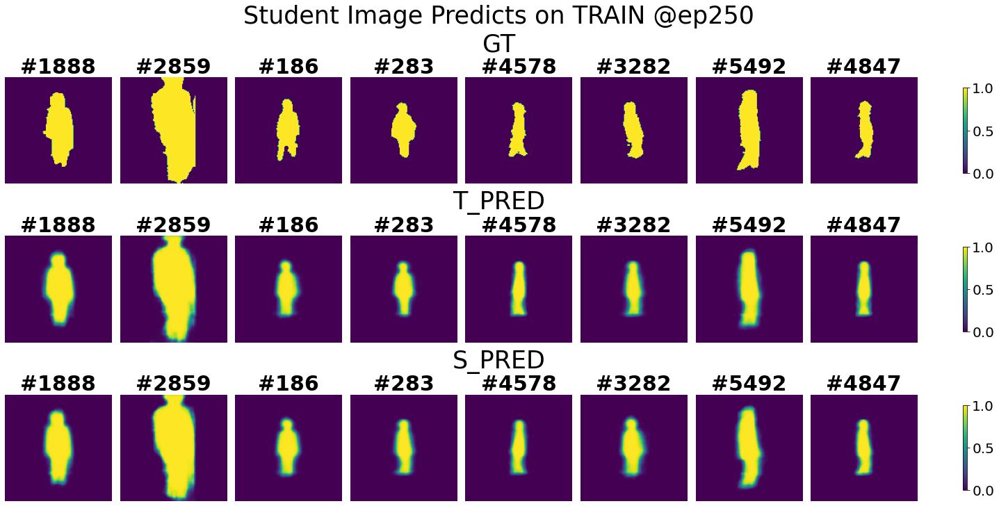

<Figure size 1440x720 with 0 Axes>

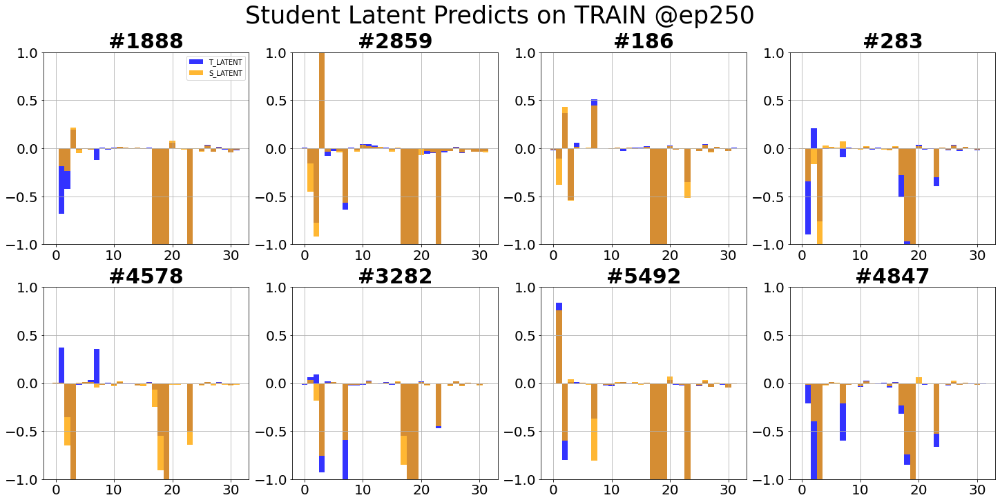

<Figure size 1440x720 with 0 Axes>

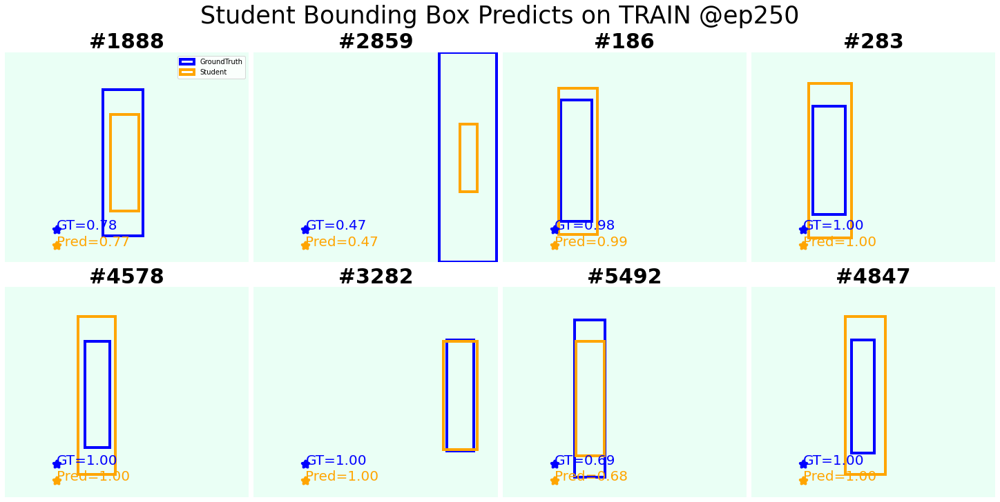

<Figure size 1440x720 with 0 Axes>

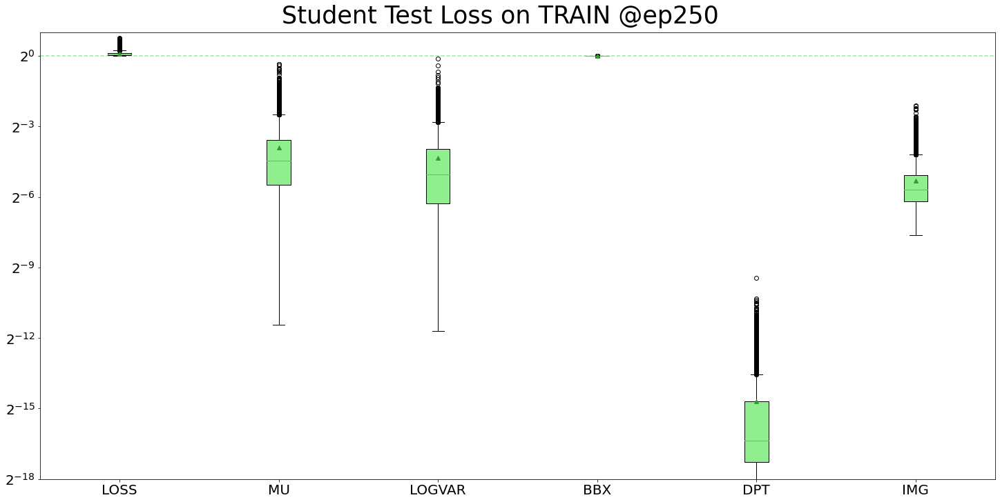

<Figure size 1440x720 with 0 Axes>

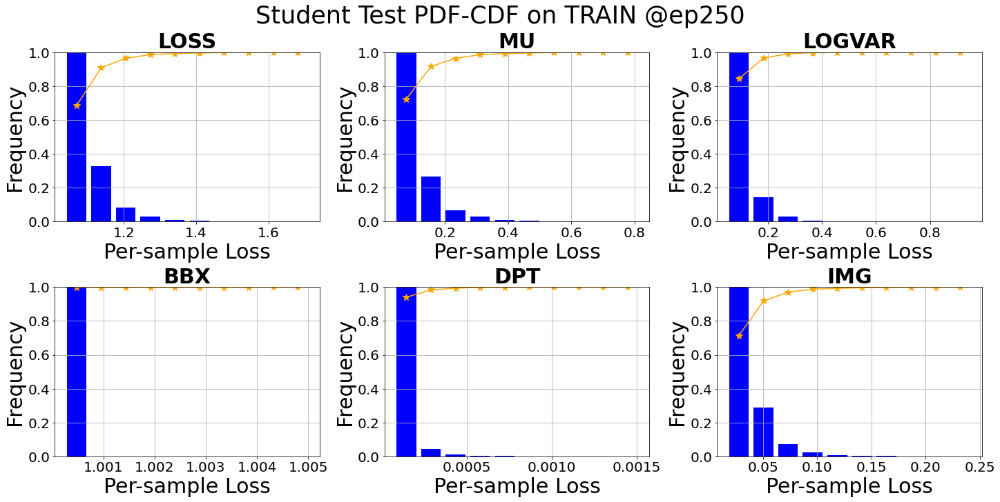

Student valid: epoch=9/10, batch=15/19, current best valid loss=64.0140        4.0140    
Total training time: 1283.41357588768 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=1.0589    
Test finished. Average loss={'LOSS': 1.0612053045785272, 'MU': 0.06413403207750581, 'LOGVAR': 0.04819576703584971, 'BBX': 1.000010925961973, 'DPT': 2.479974471261386e-05, 'IMG': 0.02485490769105162}

Total training time: 98.39404249191284 sec


<Figure size 1440x720 with 0 Axes>

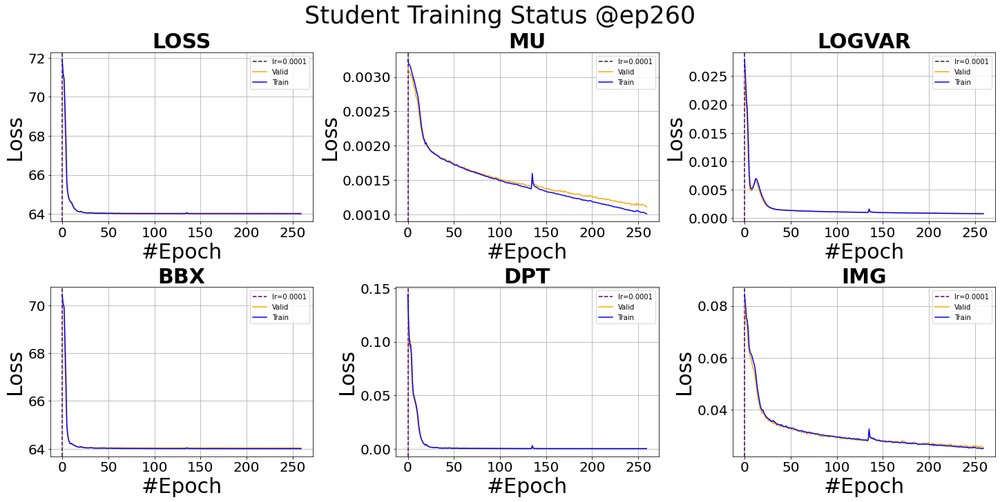

<Figure size 1440x720 with 0 Axes>

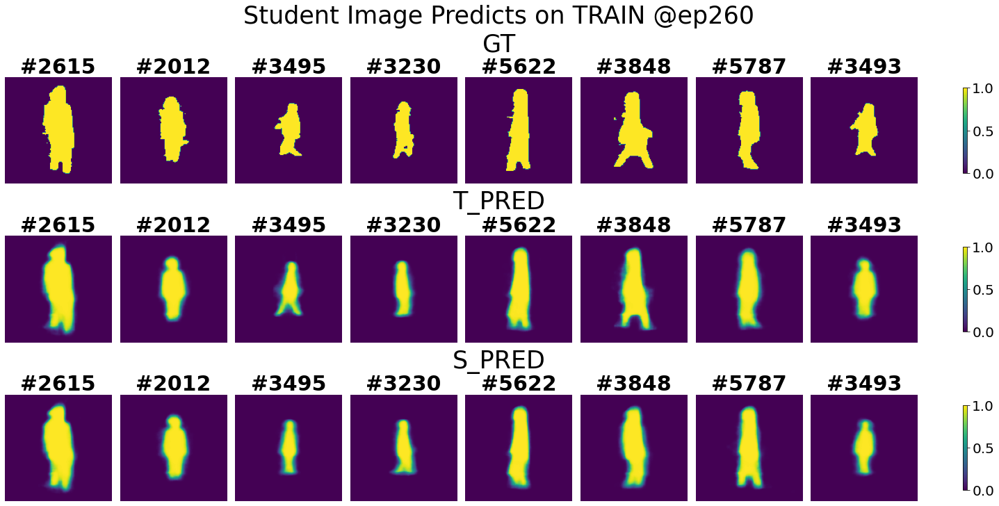

<Figure size 1440x720 with 0 Axes>

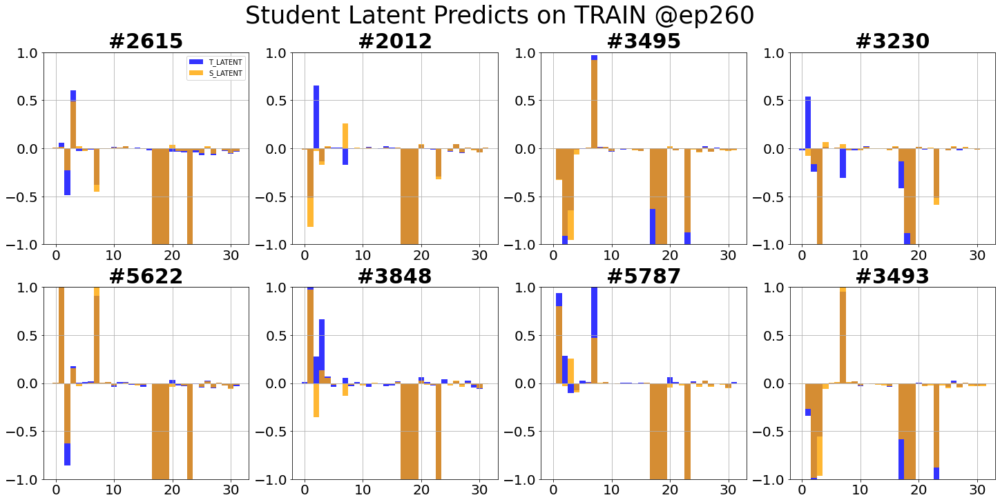

<Figure size 1440x720 with 0 Axes>

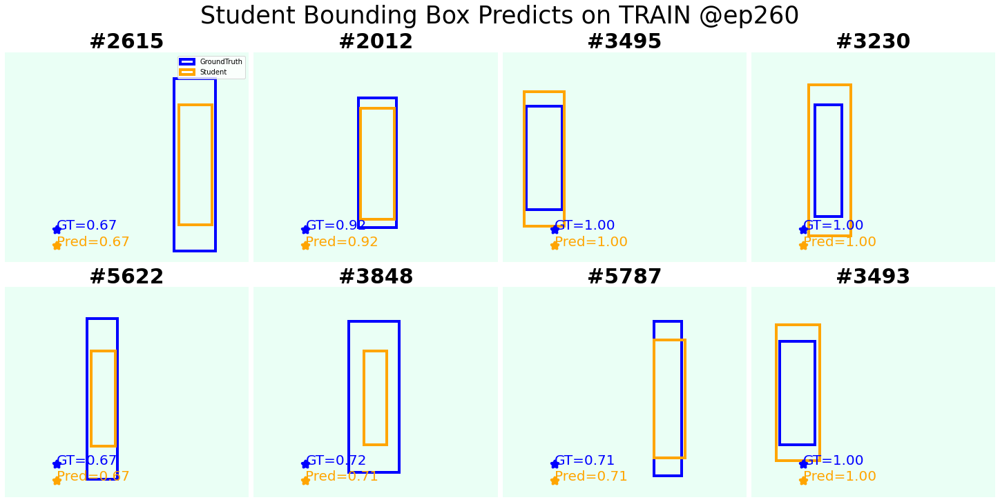

<Figure size 1440x720 with 0 Axes>

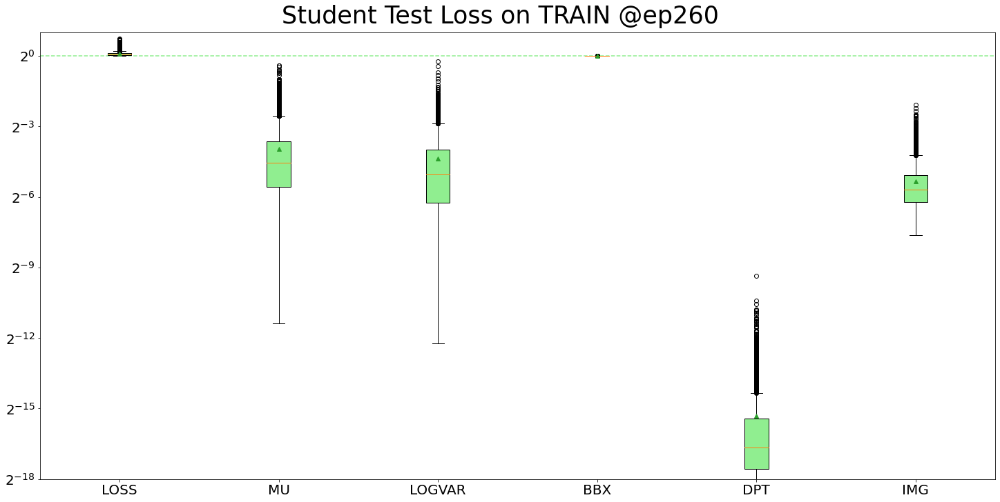

<Figure size 1440x720 with 0 Axes>

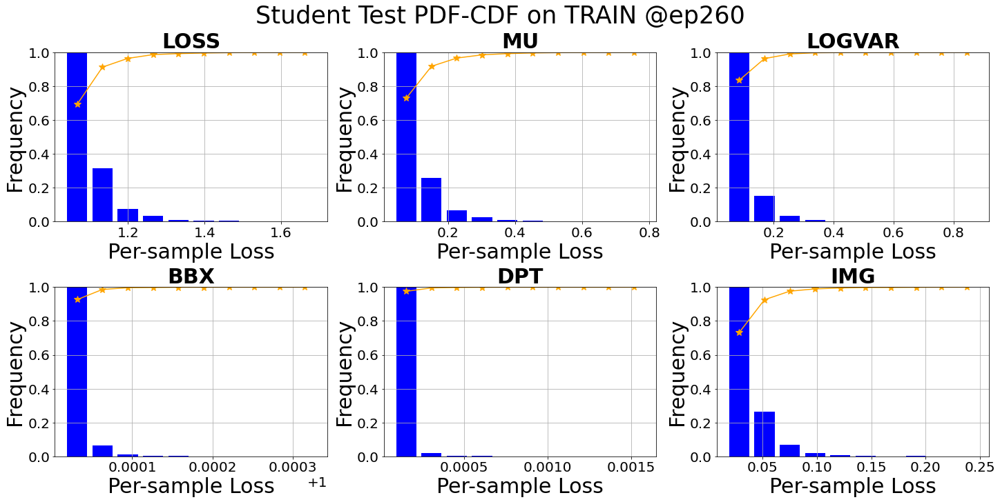

Student valid: epoch=9/10, batch=15/19, current best valid loss=64.0140        4.0140    
Total training time: 1286.2062590122223 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=1.0025    
Test finished. Average loss={'LOSS': 1.0593479863283308, 'MU': 0.062110974571872, 'LOGVAR': 0.04708866613457628, 'BBX': 1.000022449542756, 'DPT': 2.1902393794607544e-05, 'IMG': 0.024574909256880818}

Total training time: 98.56922340393066 sec


<Figure size 1440x720 with 0 Axes>

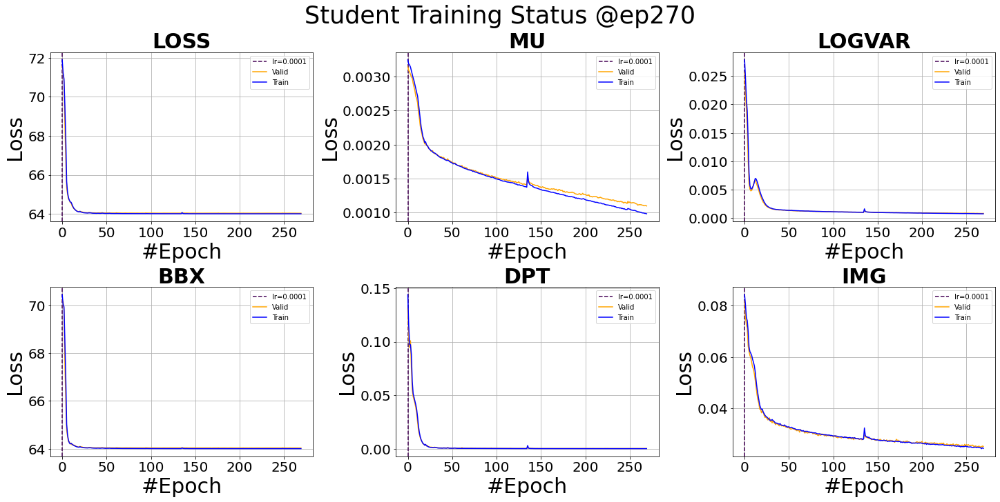

<Figure size 1440x720 with 0 Axes>

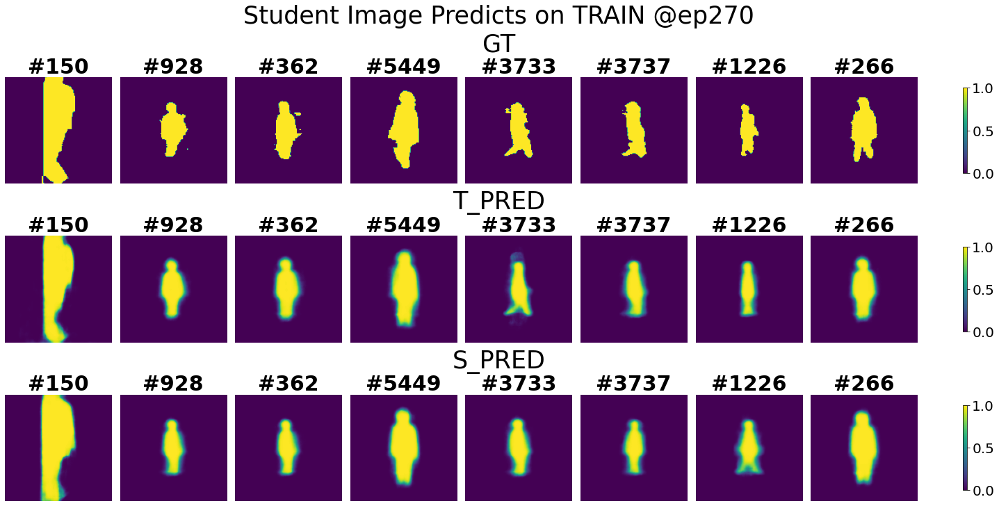

<Figure size 1440x720 with 0 Axes>

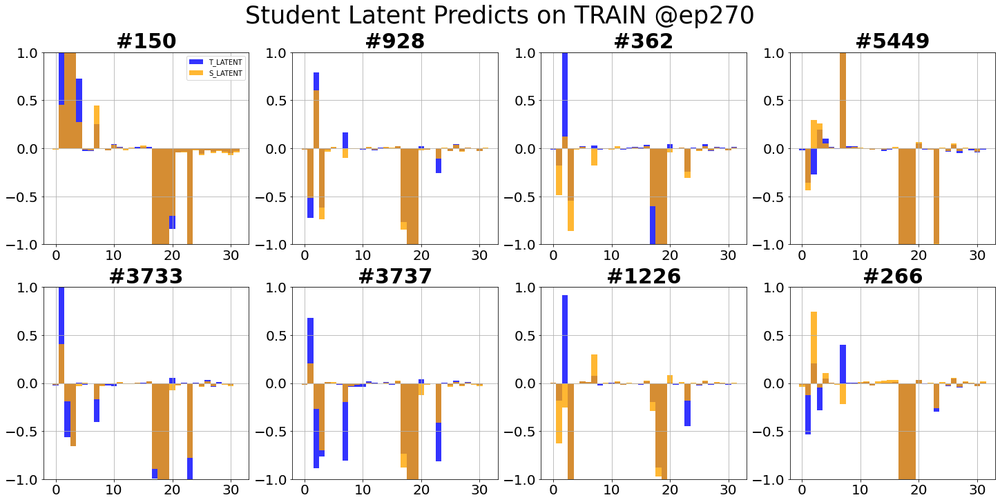

<Figure size 1440x720 with 0 Axes>

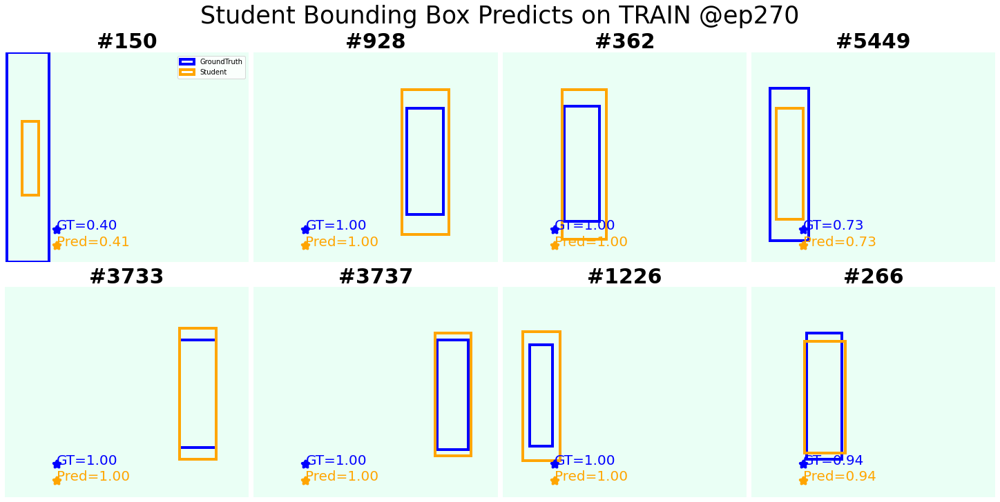

<Figure size 1440x720 with 0 Axes>

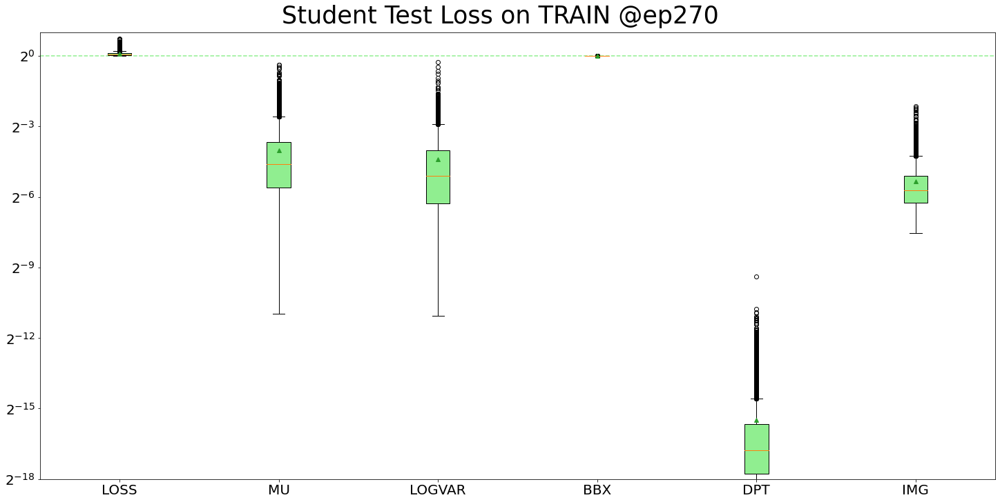

<Figure size 1440x720 with 0 Axes>

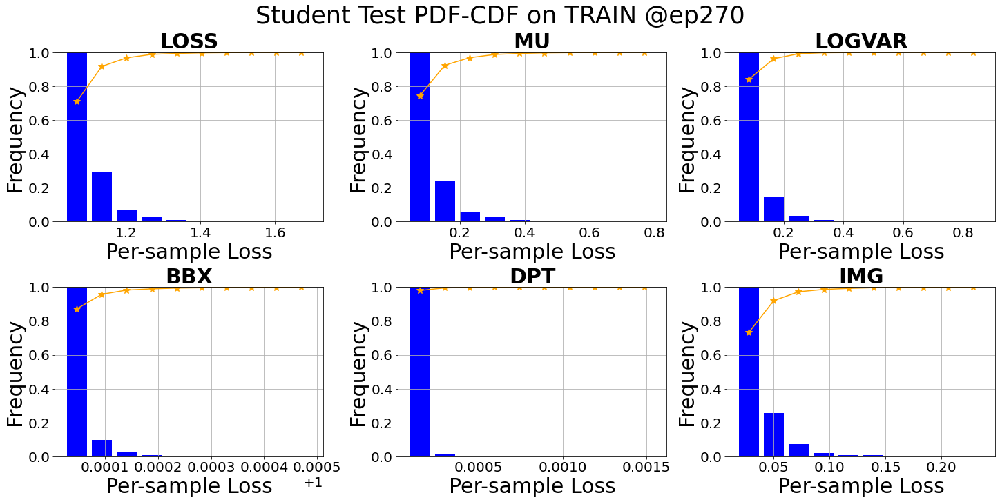

Student valid: epoch=9/10, batch=15/19, current best valid loss=64.0140        4.0140    
Total training time: 1286.1868271827698 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=1.0410    
Test finished. Average loss={'LOSS': 1.0582792744427532, 'MU': 0.0609148020912353, 'LOGVAR': 0.046438335123250955, 'BBX': 1.000013429913428, 'DPT': 2.463342503789783e-05, 'IMG': 0.024235308351556094}

Total training time: 98.09872555732727 sec


<Figure size 1440x720 with 0 Axes>

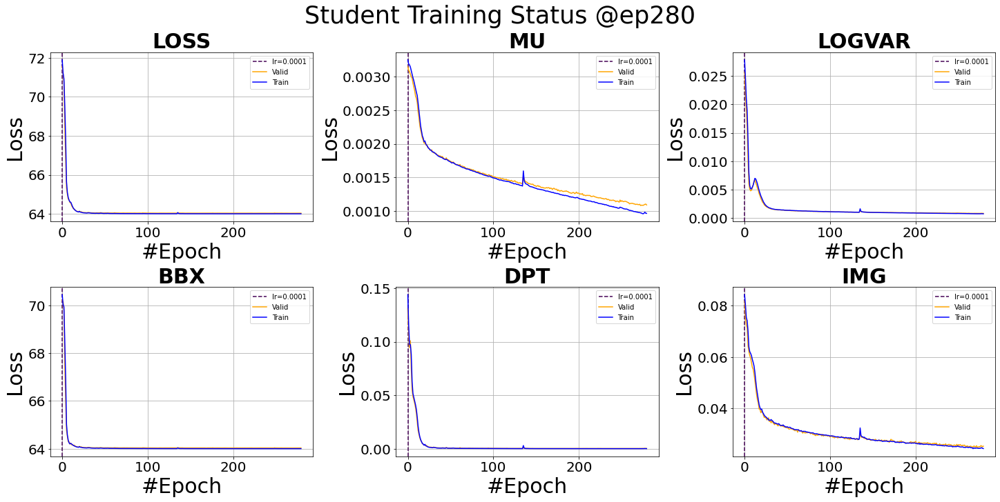

<Figure size 1440x720 with 0 Axes>

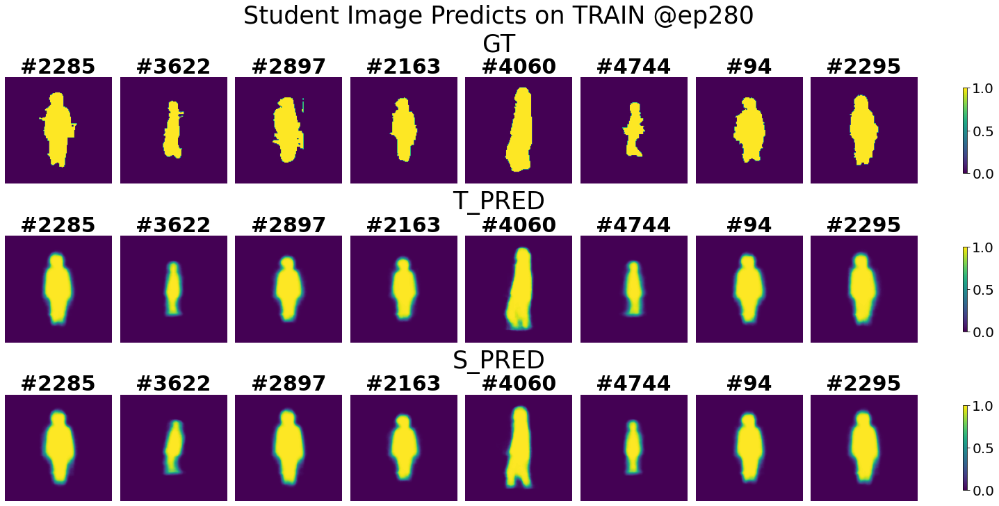

<Figure size 1440x720 with 0 Axes>

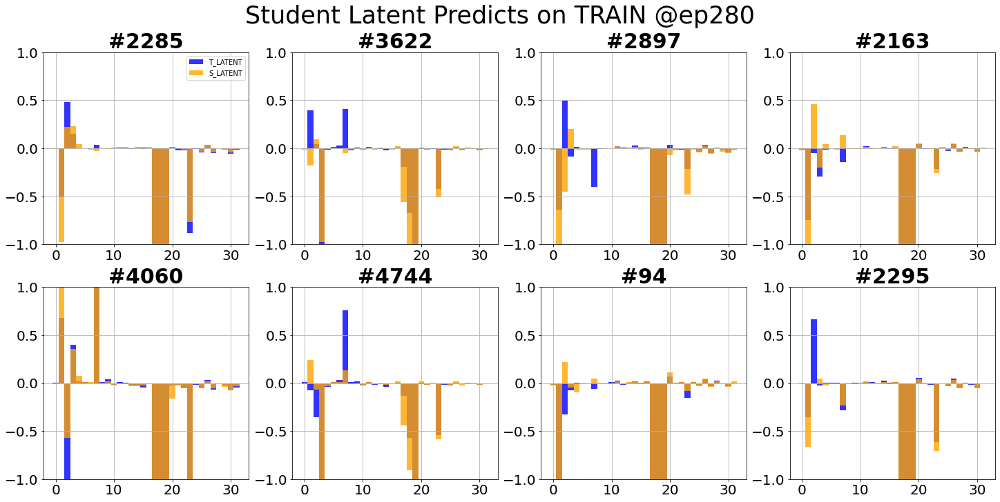

<Figure size 1440x720 with 0 Axes>

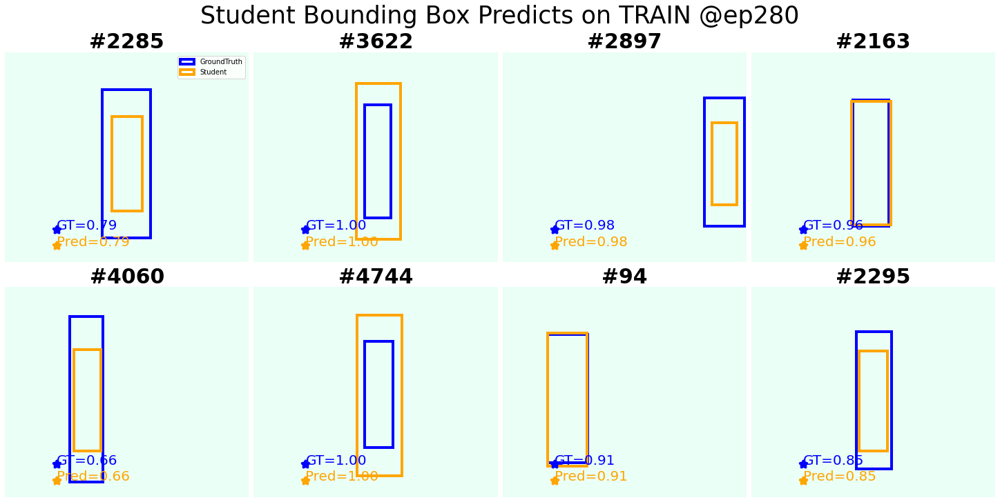

<Figure size 1440x720 with 0 Axes>

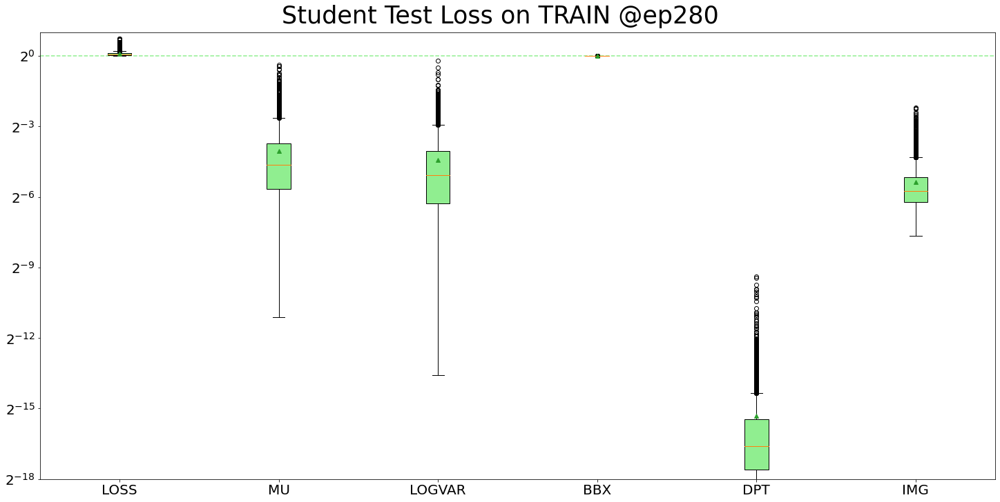

<Figure size 1440x720 with 0 Axes>

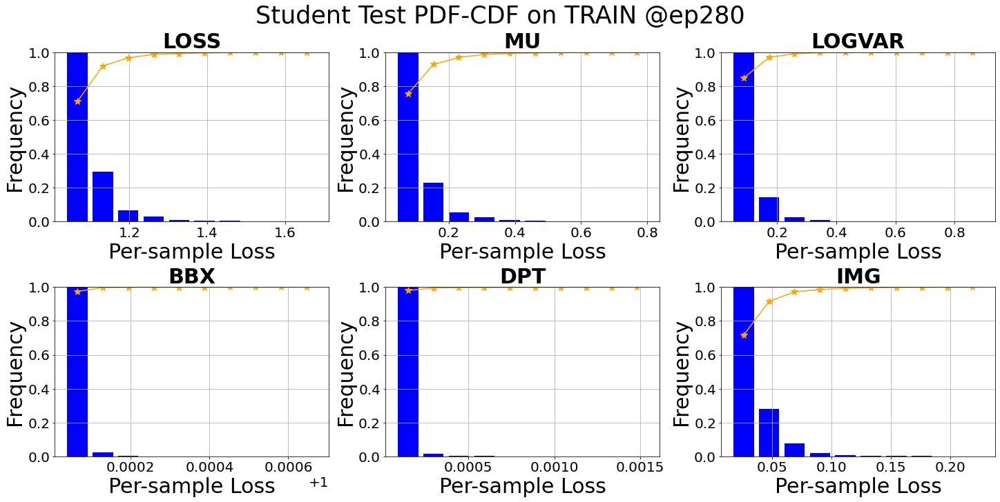

Student valid: epoch=9/10, batch=15/19, current best valid loss=64.0140        4.0140    
Total training time: 1288.7537508010864 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=1.0611    
Test finished. Average loss={'LOSS': 1.0558307143774899, 'MU': 0.05822114430151038, 'LOGVAR': 0.044962613388368294, 'BBX': 1.0000134382106654, 'DPT': 2.478379334211665e-05, 'IMG': 0.023847462058988817}

Total training time: 98.38833904266357 sec


<Figure size 1440x720 with 0 Axes>

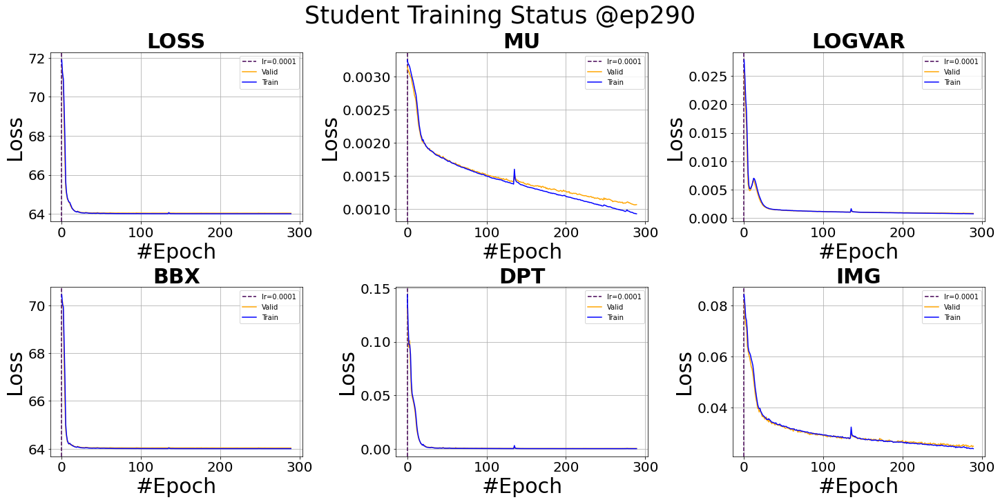

<Figure size 1440x720 with 0 Axes>

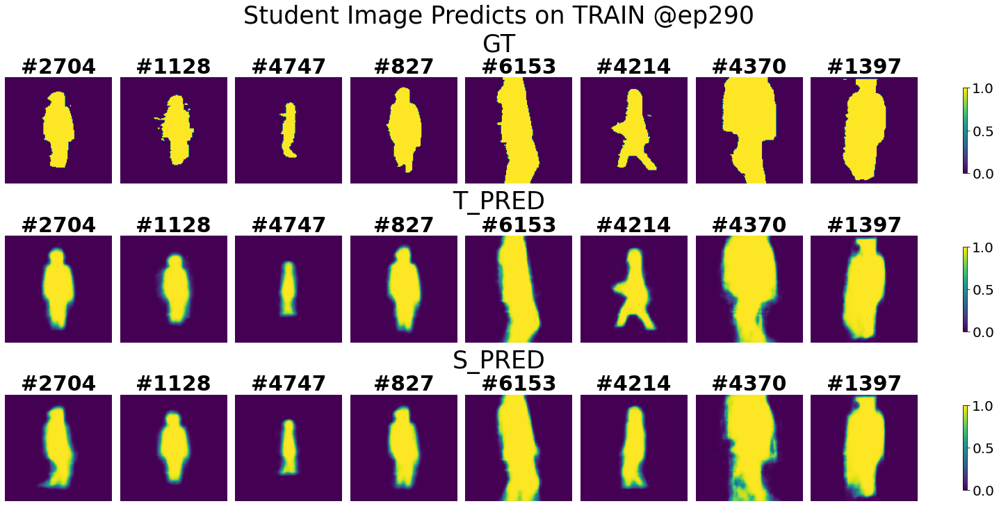

<Figure size 1440x720 with 0 Axes>

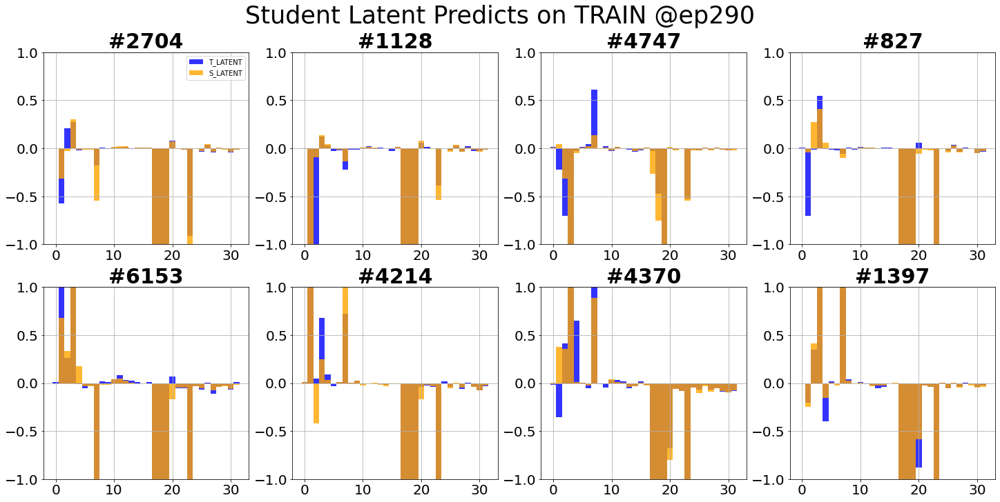

<Figure size 1440x720 with 0 Axes>

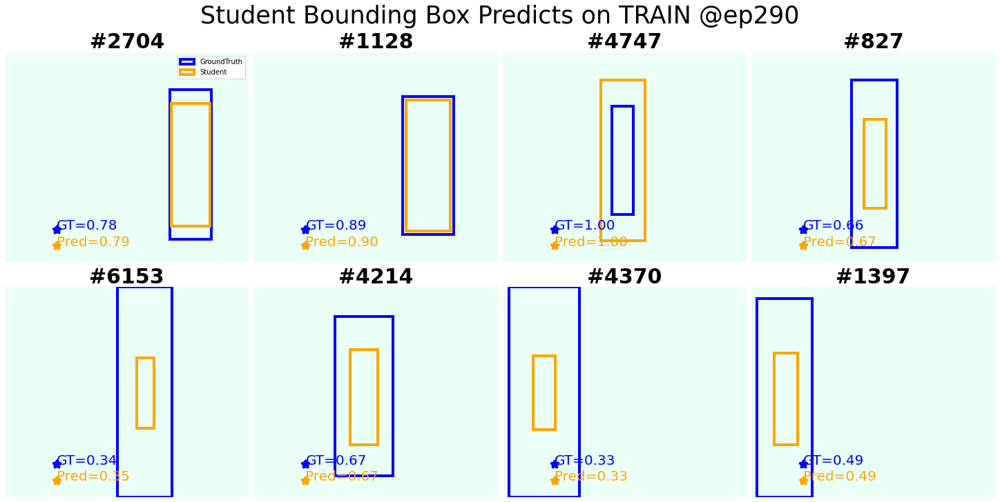

<Figure size 1440x720 with 0 Axes>

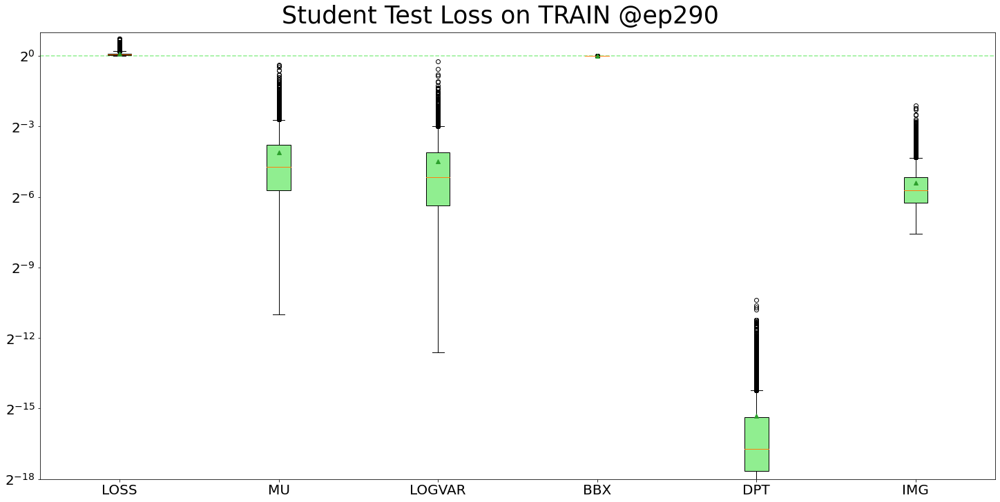

<Figure size 1440x720 with 0 Axes>

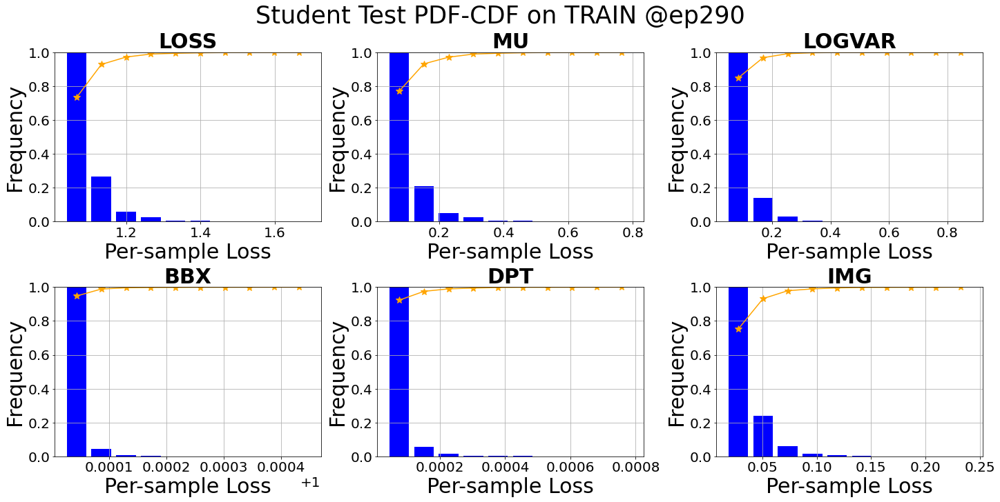

Student valid: epoch=9/10, batch=15/19, current best valid loss=64.0140        4.0140    
Total training time: 1284.4638512134552 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=1.0287    
Test finished. Average loss={'LOSS': 1.0535678210148176, 'MU': 0.05578733059916307, 'LOGVAR': 0.04376085656797563, 'BBX': 1.000012815651762, 'DPT': 1.7296824583245636e-05, 'IMG': 0.023452463909052312}

Total training time: 97.3637547492981 sec


<Figure size 1440x720 with 0 Axes>

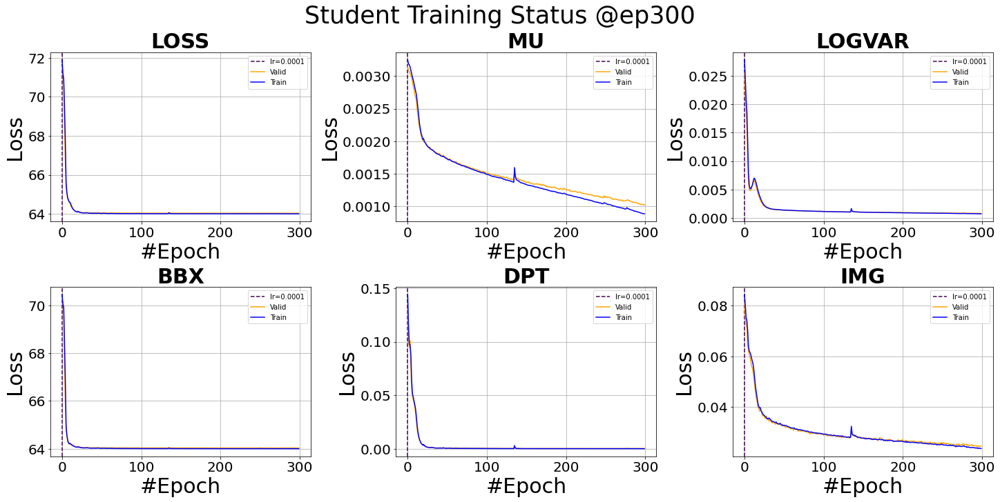

<Figure size 1440x720 with 0 Axes>

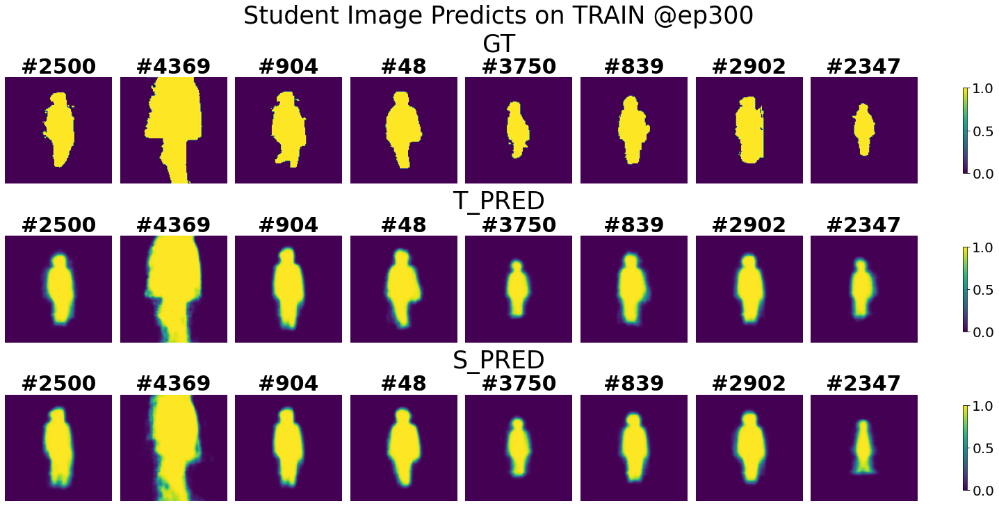

<Figure size 1440x720 with 0 Axes>

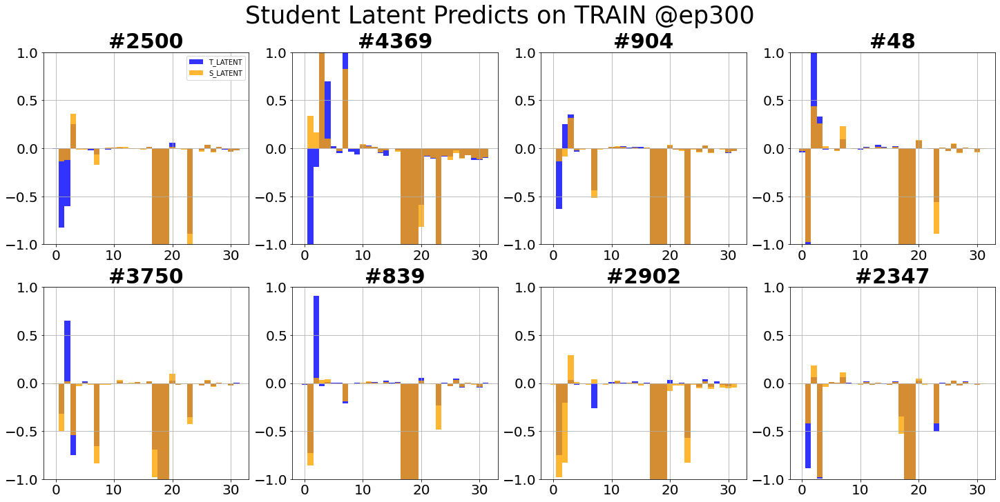

<Figure size 1440x720 with 0 Axes>

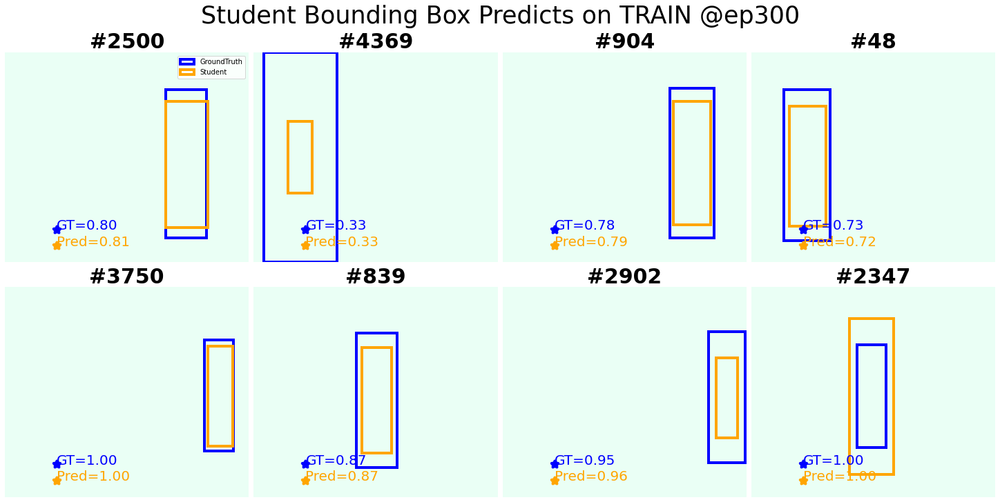

<Figure size 1440x720 with 0 Axes>

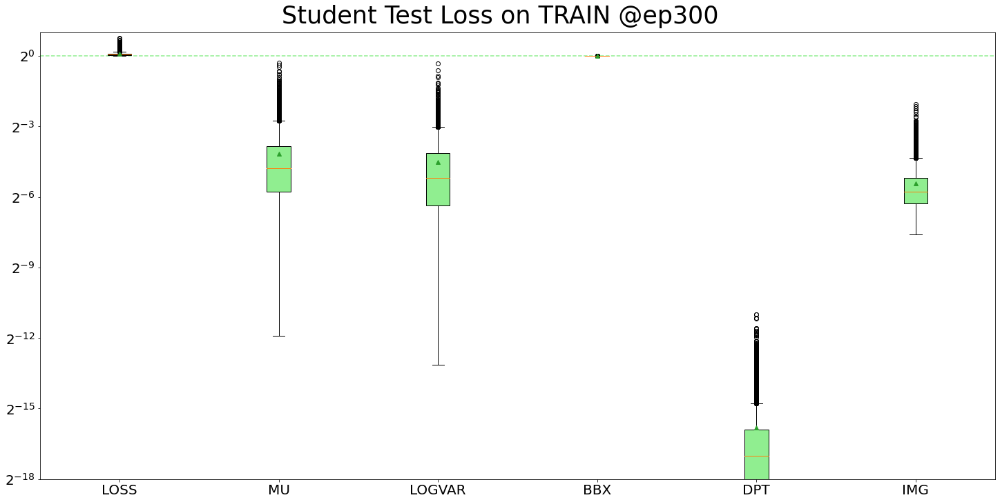

<Figure size 1440x720 with 0 Axes>

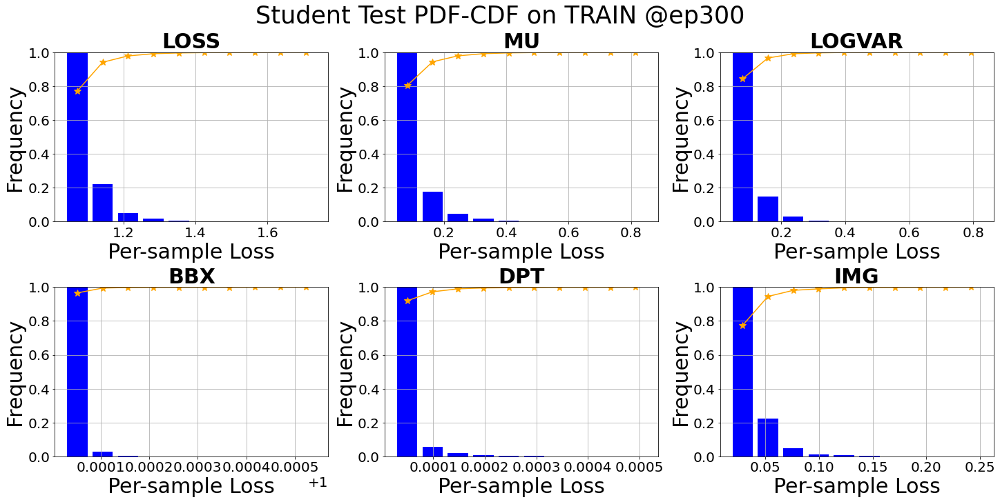


Schedule Completed!


In [10]:
### Scheduler
%matplotlib inline
#trainer1.lr=1e-5
S_trainer.scheduler(turns=10,
                  test_loader='train', select_num=8,
                  autosave=True, notion=f"{date}_{run}", train_module={'csien', 'bbxde'}, eval_module={'imgen', 'imgde'}, save_model=False)

/home/bob/.local/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py:172: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:199.)
  return collate([torch.as_tensor(b) for b in batch], collate_fn_map=collate_fn_map)
/home/bob/.local/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py:172: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest 

Student test: sample=5/930, loss=1.1071    

/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=925/930, loss=1.1647    
Test finished. Average loss={'LOSS': 1.341931834015795, 'MU': 0.1327060126931086, 'LOGVAR': 0.19540246412979023, 'BBX': 1.0136188143043108, 'DPT': 0.018306771327065503, 'IMG': 0.03880366796517484}

Total training time: 23.25902223587036 sec


<Figure size 1440x720 with 0 Axes>

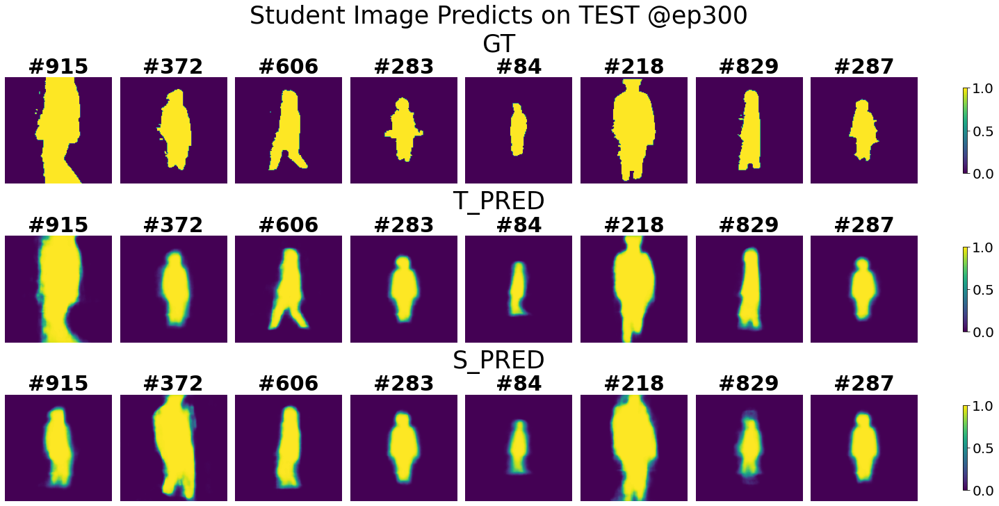

<Figure size 1440x720 with 0 Axes>

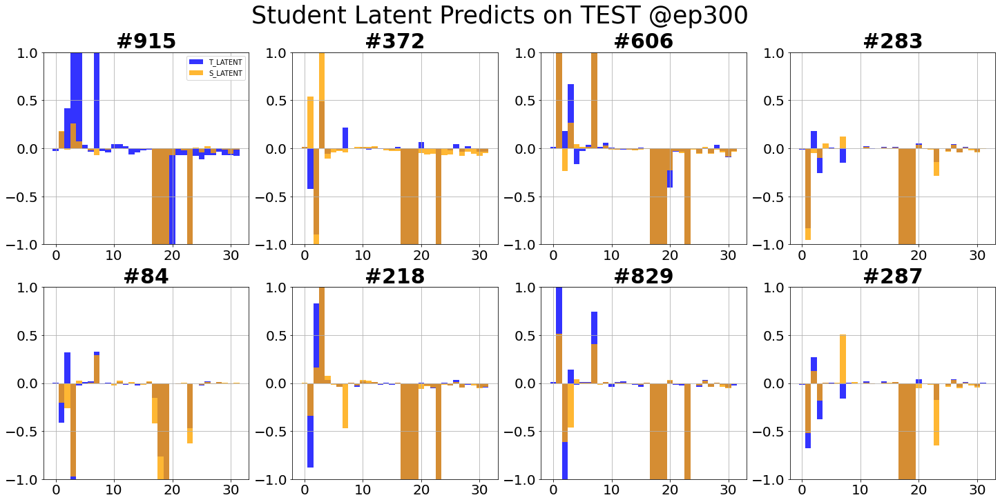

<Figure size 1440x720 with 0 Axes>

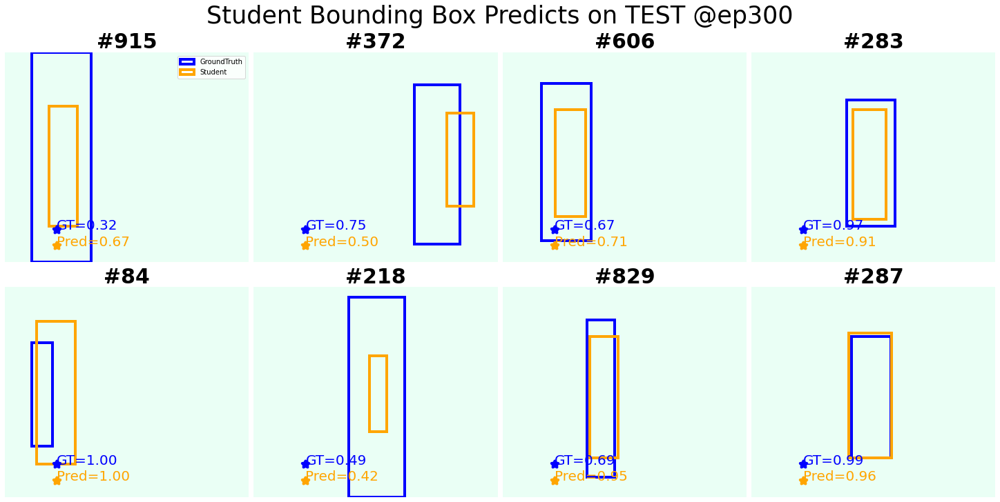

<Figure size 1440x720 with 0 Axes>

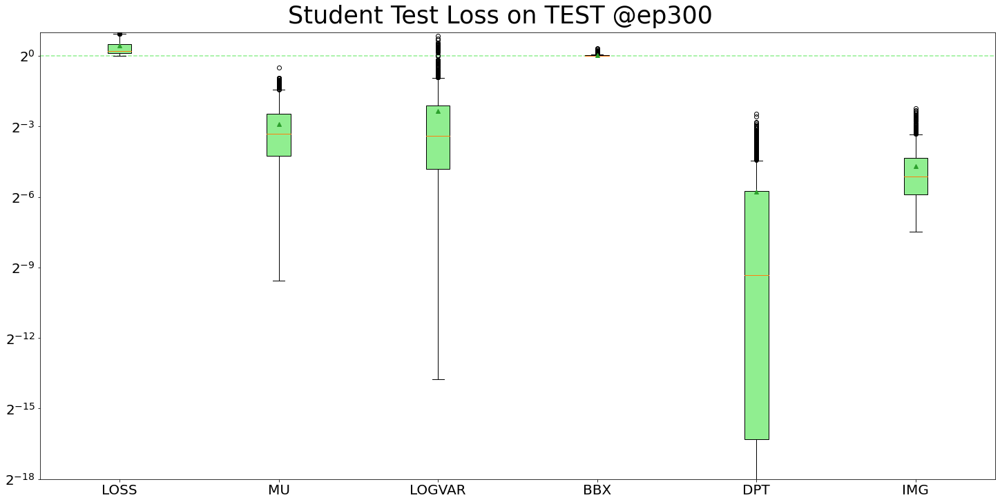

<Figure size 1440x720 with 0 Axes>

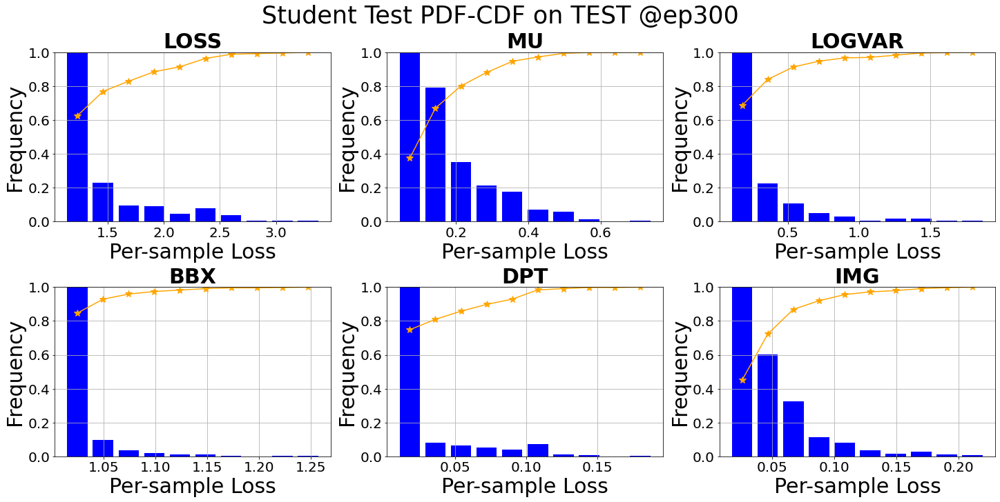

In [11]:
S_trainer.test(loader='test')
S_trainer.plot_test(select_num=8, autosave=True, notion=f"{date}_{run}")

In [12]:
a = 1

In [12]:
S_trainer.save(f"{date}_{run}")

Saving models...
Saving csien...
Saving bbxde...
Saving imgen...
Saving imgde...
All saved!


In [13]:
S_trainer.loss.save('pred', f"{date}_{run}")

Saving pred including GT, T_PRED, S_PRED, T_LATENT, S_LATENT, GT_BBX, S_BBX, GT_DPT, S_DPT, IND...Done


#### Test

/home/bob/datastore/Models/Trainer.py:191: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at ../aten/src/ATen/native/Copy.cpp:250.)
  data_[key] = value.to(torch.float32).to(self.device)
/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=15/17, loss=0.1052    
Test finished. Average loss={'LOSS': 0.0577851046802928, 'MU': 0.35868602988407744, 'LOGVAR': 0.17540513204082397, 'BBX': 0.5955600273343461, 'DPT': 0.029040615619575945, 'IMG': 0.07803787530129365}

Total training time: 9.84715747833252 sec


<Figure size 432x288 with 0 Axes>

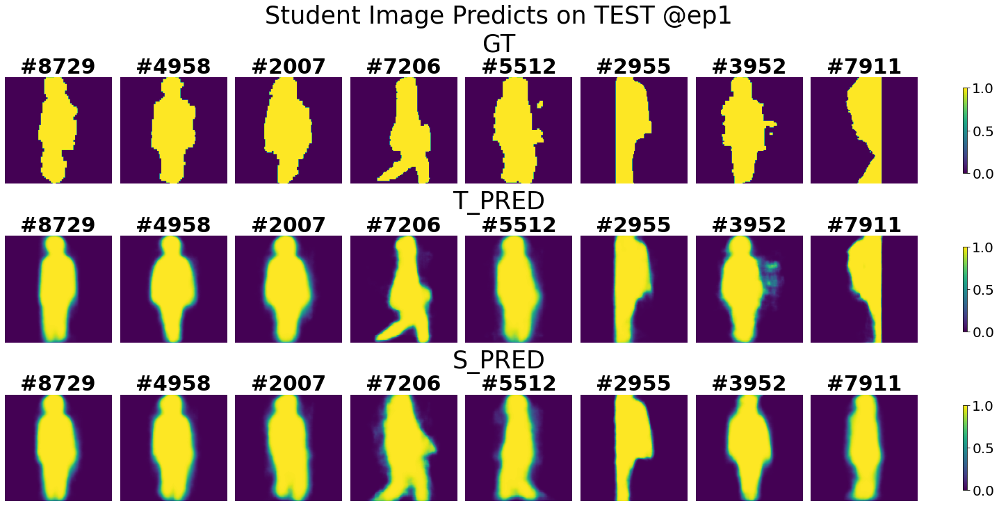

<Figure size 1440x720 with 0 Axes>

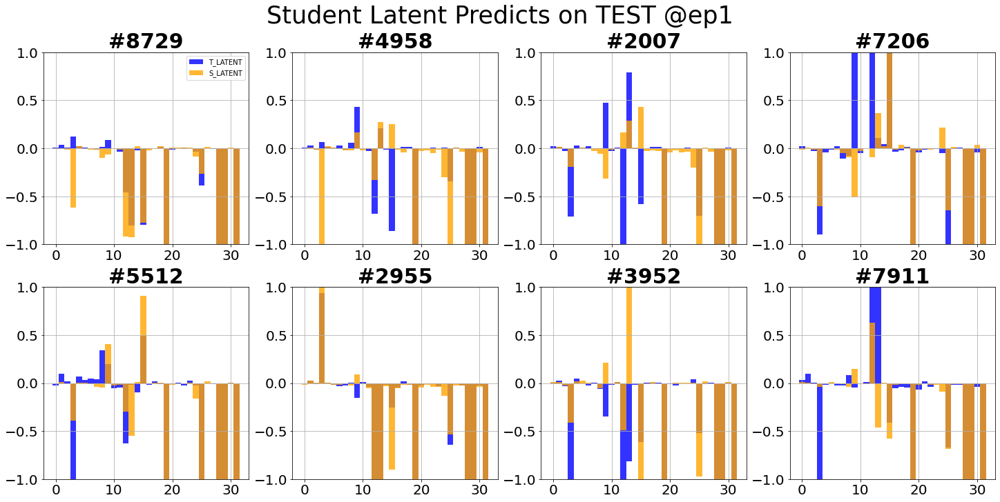

<Figure size 1440x720 with 0 Axes>

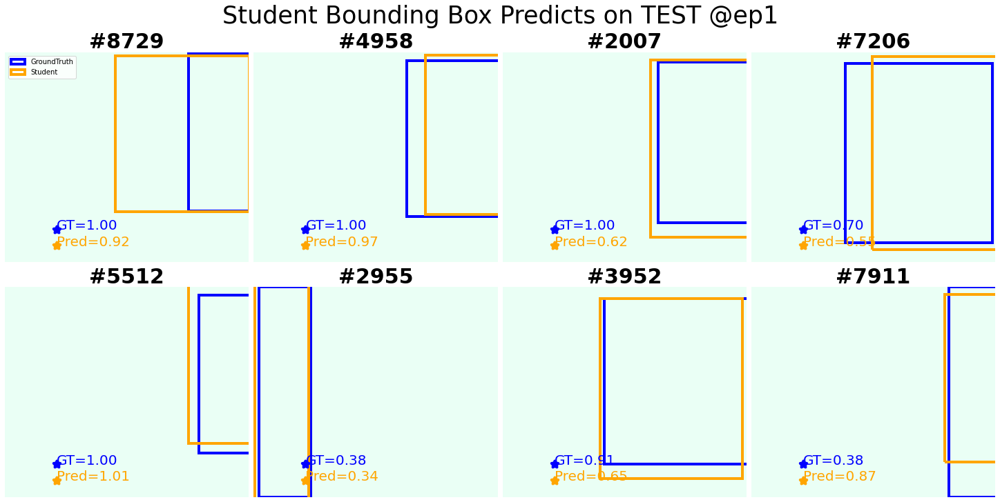

<Figure size 1440x720 with 0 Axes>

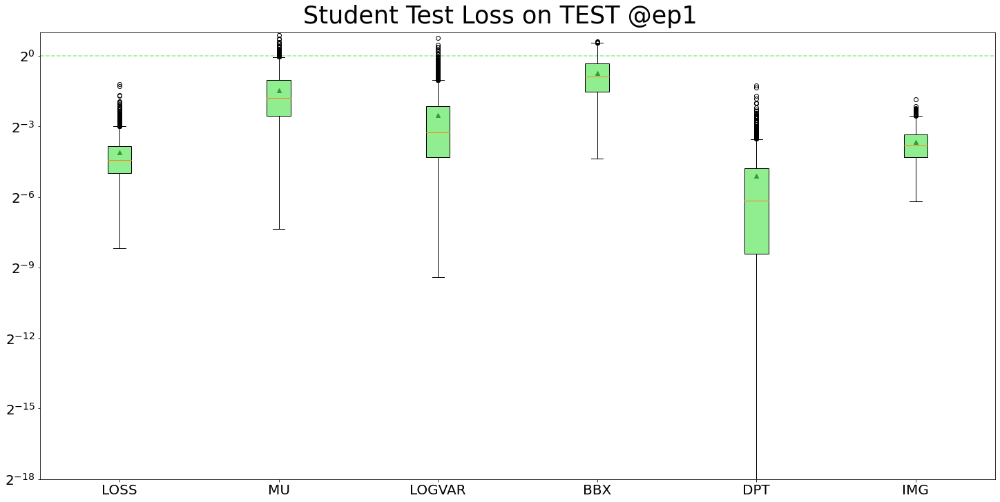

<Figure size 1440x720 with 0 Axes>

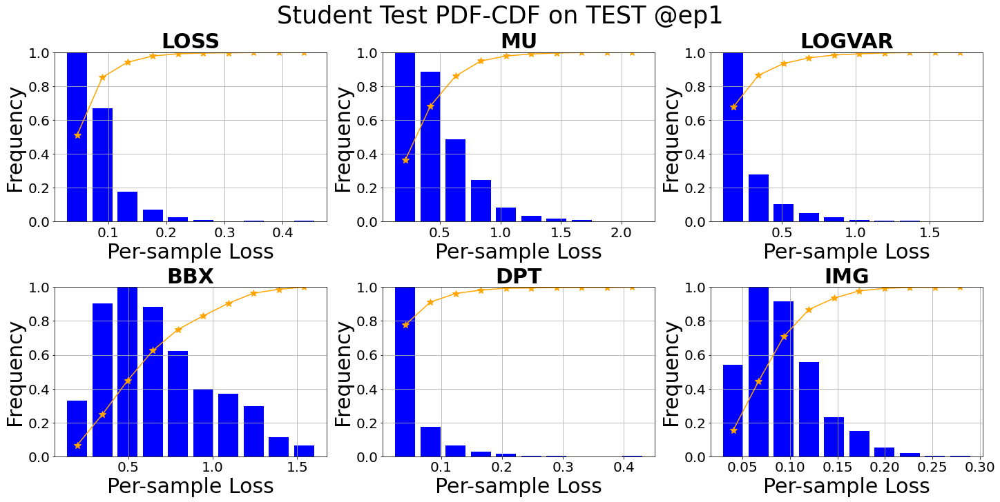

In [5]:
torch.cuda.set_device(gpu)
csiencoder = TP.CSIEncoder()
bbxdecoder = TP.BBXDecoder()
imgencoder = TP.ImageEncoder(latent_dim=16)
imgdecoder = TP.ImageDecoder(latent_dim=16)

imgencoder.load_state_dict(torch.load(f"../saved/240320R2/240320R2_Student_IMGENV06C2@ep200.pth"))
imgdecoder.load_state_dict(torch.load(f"../saved/240320R2/240320R2_Student_IMGDEV06C2@ep200.pth"))
csiencoder.load_state_dict(torch.load(f"../saved/240320R2/240320R2_Student_CSIENV06C2@ep200.pth"))
bbxdecoder.load_state_dict(torch.load(f"../saved/240320R2/240320R2_Student_BBXDEV06C2@ep200.pth"))

S_trainer = TP.StudentTrainer(
                              name='Student', mask=True,
    networks=[csiencoder, bbxdecoder, imgencoder, imgdecoder],
                 lr=1e-4, epochs=10, cuda=gpu,
                 train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader)

S_trainer.test(loader='test')
S_trainer.plot_test(select_num=8, autosave=True, notion=f"{date_run}_Comp")

In [7]:
S_trainer.loss.save('pred', f"{date_run}_Comp")

Saving pred including GT T_PRED S_PRED T_LATENT S_LATENT GT_BBX S_BBX GT_DPT S_DPT IND...Done
